### Import necessary libraries

In [1]:
import time
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from utils.read_depth_info import read_depth_info
from utils.model import Hourglass
from utils.loader import load_images, load_labels
from utils.check import check_fn
from utils.loss import loss_fn

%matplotlib inline

### Set trivials

In [2]:
# Path of the "Depth In the Wild" dataset
DIW_PATH = 'data'
# Model input size (240x320, RGB, 3 channels)
input_width = 320 # 320 column
input_height = 240 # 240 row
# Training batch size
batch_size = 4

### Load ordinal notations from .csv file for training

In [3]:
# Train_val label construction
train_depth_info = read_depth_info(DIW_PATH + '/DIW_train_val.csv', input_height, input_width)
# Print an example
print("train_val label example:", train_depth_info['./DIW_train_val/dc4b5a857a519b705dafb01354765e1714959a11.thumb'])

Successfully processed 404880 labels from C://Users/admin/data/DIW_train_val.csv.
train_val label example: [[55, 33, 55, 285, -1]]


Yufan's Note: The label means [yA, xA, yB, xB, relation]. For the relation, "1" means point A is closer (A < B), and "-1" means point B is closer (A > B).

### Load model

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_image (InputLayer)        [(None, 240, 320, 3) 0                                            
__________________________________________________________________________________________________
H1 (Conv2D)                     (None, 240, 320, 128 3584        Input_image[0][0]                
__________________________________________________________________________________________________
C4_pooling (AveragePooling2D)   (None, 120, 160, 128 0           H1[0][0]                         
__________________________________________________________________________________________________
C4_B1 (Inception)               (None, 120, 160, 128 102496      C4_pooling[0][0]                 
______________________________________________________________________________________________

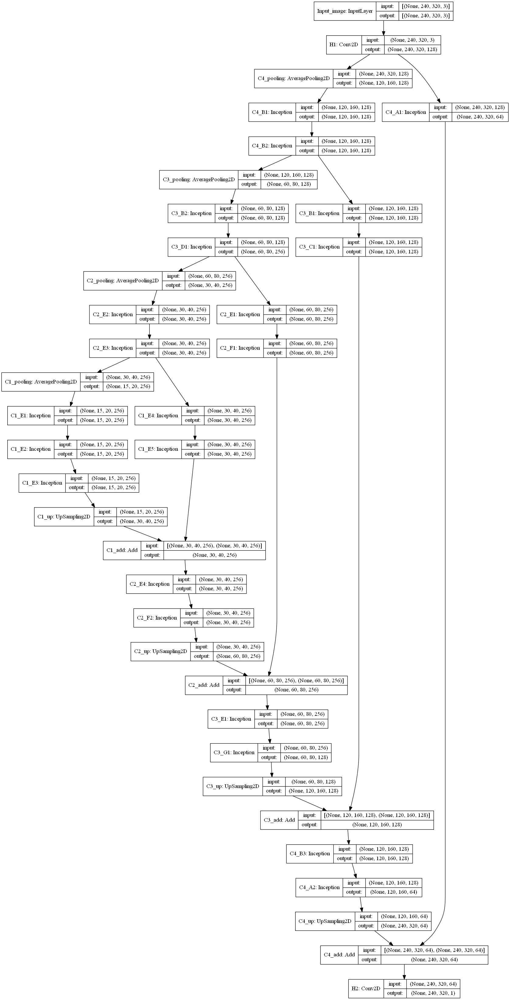

In [4]:
# Model instantiation
model_Hourglass = Hourglass(input_height, input_width, name="Hourglass")
model_Hourglass.build(input_shape=(None, input_height, input_width, 3)) # "None" represents the batch dimension
# Show model structure
model_Hourglass.my_summary()
model_Hourglass.plot_network()

Epoch 1/2:
Examined samples: 1000 - loss: 753.8285 - current acc: 0.4680


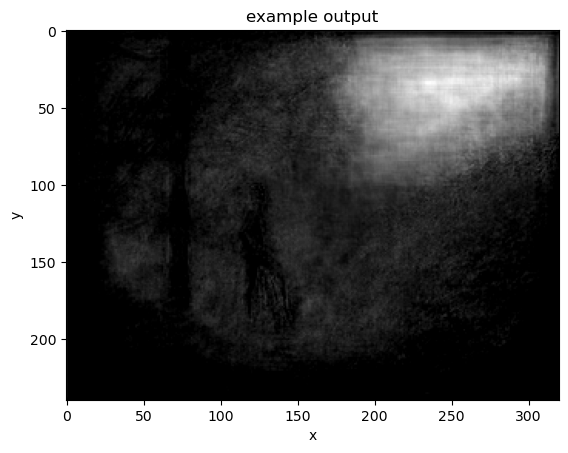

____________________________________________________________________________________________________
Examined samples: 2000 - loss: 1514.1656 - current acc: 0.4380
Examined samples: 3000 - loss: 2233.6597 - current acc: 0.4197
Examined samples: 4000 - loss: 2923.0366 - current acc: 0.4343
Examined samples: 5000 - loss: 3633.3181 - current acc: 0.4580
Examined samples: 6000 - loss: 4312.2793 - current acc: 0.4790
Examined samples: 7000 - loss: 4977.1069 - current acc: 0.4957
Examined samples: 8000 - loss: 5600.0625 - current acc: 0.5151
Examined samples: 9000 - loss: 6220.1328 - current acc: 0.5293
Examined samples: 10000 - loss: 6875.9092 - current acc: 0.5394


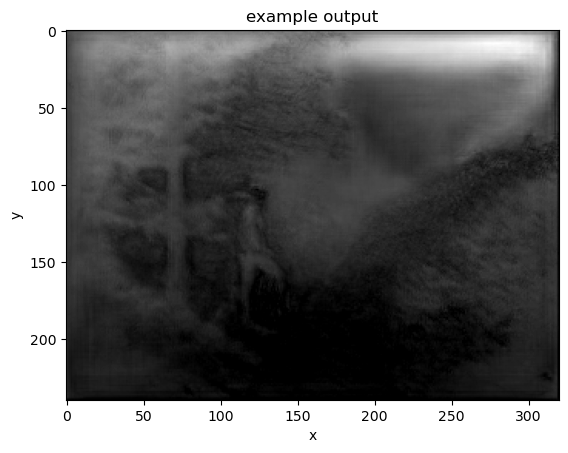

____________________________________________________________________________________________________
Examined samples: 11000 - loss: 7509.0063 - current acc: 0.5505
Examined samples: 12000 - loss: 8138.0903 - current acc: 0.5597
Examined samples: 13000 - loss: 8759.4814 - current acc: 0.5682
Examined samples: 14000 - loss: 9368.1074 - current acc: 0.5755
Examined samples: 15000 - loss: 9960.9414 - current acc: 0.5828
Examined samples: 16000 - loss: 10573.1074 - current acc: 0.5891
Examined samples: 17000 - loss: 11151.0791 - current acc: 0.5952
Examined samples: 18000 - loss: 11769.6924 - current acc: 0.6006
Examined samples: 19000 - loss: 12344.0508 - current acc: 0.6053
Examined samples: 20000 - loss: 12950.6396 - current acc: 0.6080


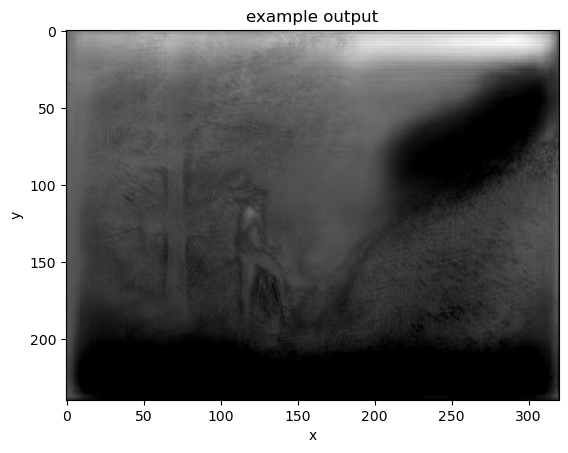

____________________________________________________________________________________________________
Examined samples: 21000 - loss: 13545.9863 - current acc: 0.6110
Examined samples: 22000 - loss: 14155.9131 - current acc: 0.6138
Examined samples: 23000 - loss: 14760.7168 - current acc: 0.6152
Examined samples: 24000 - loss: 15318.0615 - current acc: 0.6180
Examined samples: 25000 - loss: 15911.2979 - current acc: 0.6200
Examined samples: 26000 - loss: 16498.5898 - current acc: 0.6227
Examined samples: 27000 - loss: 17075.4238 - current acc: 0.6257
Examined samples: 28000 - loss: 17648.1504 - current acc: 0.6280
Examined samples: 29000 - loss: 18221.3594 - current acc: 0.6297
Examined samples: 30000 - loss: 18748.5508 - current acc: 0.6323


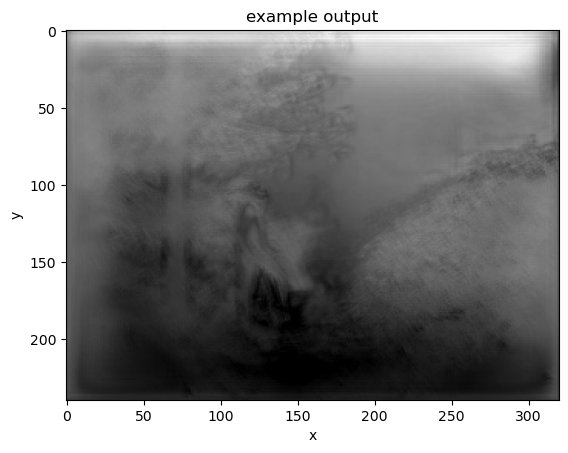

____________________________________________________________________________________________________
Examined samples: 31000 - loss: 19338.2012 - current acc: 0.6336
Examined samples: 32000 - loss: 19911.6758 - current acc: 0.6349
Examined samples: 33000 - loss: 20523.4551 - current acc: 0.6357
Examined samples: 34000 - loss: 21133.4004 - current acc: 0.6359
Examined samples: 35000 - loss: 21702.5586 - current acc: 0.6371
Examined samples: 36000 - loss: 22266.1230 - current acc: 0.6382
Examined samples: 37000 - loss: 22855.1387 - current acc: 0.6389
Examined samples: 38000 - loss: 23399.0039 - current acc: 0.6401
Examined samples: 39000 - loss: 23979.5605 - current acc: 0.6414
Examined samples: 40000 - loss: 24548.4746 - current acc: 0.6424


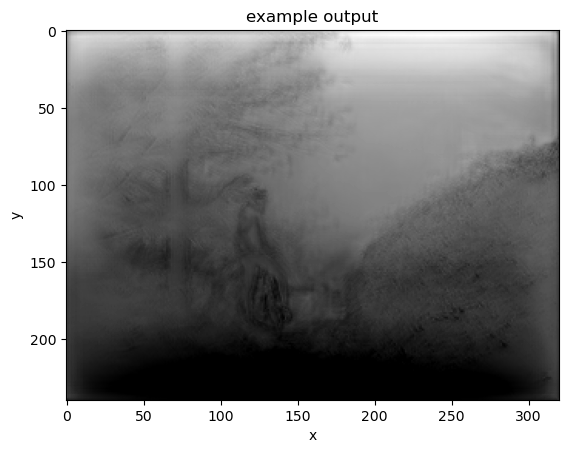

____________________________________________________________________________________________________
Examined samples: 41000 - loss: 25077.8398 - current acc: 0.6440
Examined samples: 42000 - loss: 25653.8828 - current acc: 0.6446
Examined samples: 43000 - loss: 26241.7383 - current acc: 0.6455
Examined samples: 44000 - loss: 26796.7168 - current acc: 0.6470
Examined samples: 45000 - loss: 27350.1562 - current acc: 0.6484
Examined samples: 46000 - loss: 27927.8281 - current acc: 0.6494
Examined samples: 47000 - loss: 28542.1172 - current acc: 0.6496
Examined samples: 48000 - loss: 29074.0703 - current acc: 0.6509
Examined samples: 49000 - loss: 29606.7207 - current acc: 0.6525
Examined samples: 50000 - loss: 30163.7559 - current acc: 0.6536


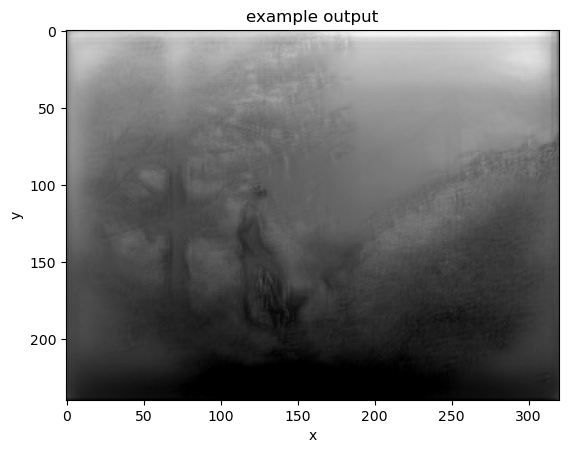

____________________________________________________________________________________________________
Examined samples: 51000 - loss: 30734.4746 - current acc: 0.6539
Examined samples: 52000 - loss: 31279.3047 - current acc: 0.6553
Examined samples: 53000 - loss: 31833.2305 - current acc: 0.6562
Examined samples: 54000 - loss: 32394.3613 - current acc: 0.6572
Examined samples: 55000 - loss: 32946.4297 - current acc: 0.6581
Examined samples: 56000 - loss: 33510.5820 - current acc: 0.6587
Examined samples: 57000 - loss: 34069.9922 - current acc: 0.6595
Examined samples: 58000 - loss: 34659.5469 - current acc: 0.6598
Examined samples: 59000 - loss: 35243.4844 - current acc: 0.6601
Examined samples: 60000 - loss: 35789.9414 - current acc: 0.6605


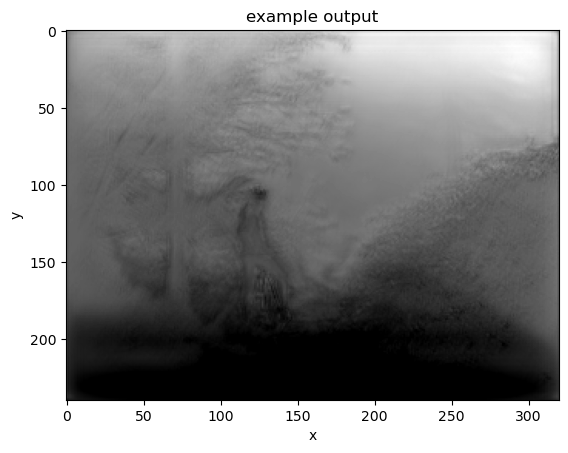

____________________________________________________________________________________________________
Examined samples: 61000 - loss: 36314.9180 - current acc: 0.6613
Examined samples: 62000 - loss: 36851.5703 - current acc: 0.6619
Examined samples: 63000 - loss: 37350.2109 - current acc: 0.6627
Examined samples: 64000 - loss: 37915.1719 - current acc: 0.6632
Examined samples: 65000 - loss: 38461.2188 - current acc: 0.6638
Examined samples: 66000 - loss: 39016.1680 - current acc: 0.6645
Examined samples: 67000 - loss: 39580.4766 - current acc: 0.6649
Examined samples: 68000 - loss: 40137.2734 - current acc: 0.6654
Examined samples: 69000 - loss: 40726.9688 - current acc: 0.6658
Examined samples: 70000 - loss: 41303.7695 - current acc: 0.6658


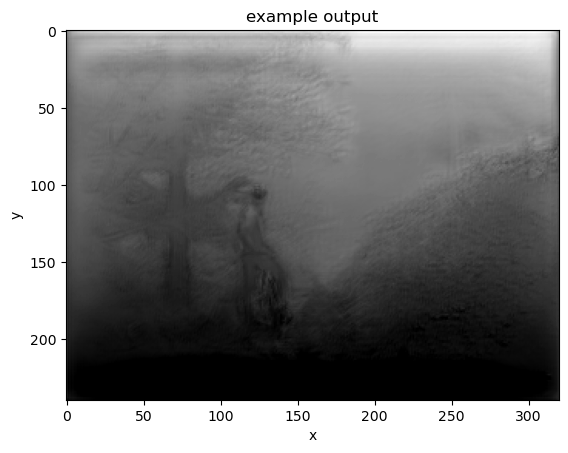

____________________________________________________________________________________________________
Examined samples: 71000 - loss: 41871.2227 - current acc: 0.6662
Examined samples: 72000 - loss: 42419.2578 - current acc: 0.6667
Examined samples: 73000 - loss: 42933.5391 - current acc: 0.6672
Examined samples: 74000 - loss: 43489.3906 - current acc: 0.6674
Examined samples: 75000 - loss: 44056.6250 - current acc: 0.6679
Examined samples: 76000 - loss: 44619.3281 - current acc: 0.6682
Examined samples: 77000 - loss: 45164.6445 - current acc: 0.6685
Examined samples: 78000 - loss: 45719.9375 - current acc: 0.6689
Examined samples: 79000 - loss: 46289.4961 - current acc: 0.6692
Examined samples: 80000 - loss: 46829.3438 - current acc: 0.6696


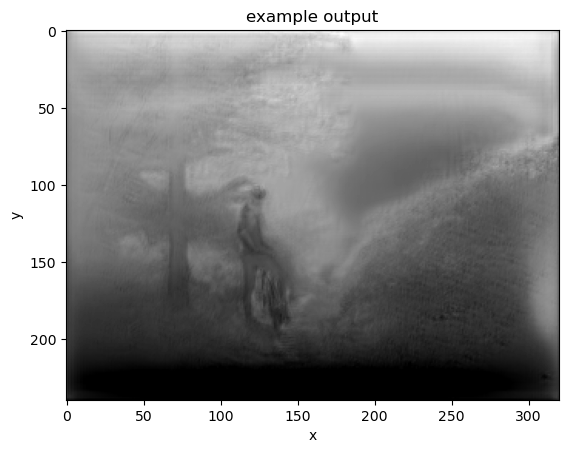

____________________________________________________________________________________________________
Examined samples: 81000 - loss: 47366.6016 - current acc: 0.6700
Examined samples: 82000 - loss: 47934.6055 - current acc: 0.6702
Examined samples: 83000 - loss: 48482.2695 - current acc: 0.6706
Examined samples: 84000 - loss: 49009.4062 - current acc: 0.6714
Examined samples: 85000 - loss: 49559.0469 - current acc: 0.6718
Examined samples: 86000 - loss: 50129.8008 - current acc: 0.6723
Examined samples: 87000 - loss: 50676.9102 - current acc: 0.6726
Examined samples: 88000 - loss: 51235.1523 - current acc: 0.6729
Examined samples: 89000 - loss: 51782.8398 - current acc: 0.6733
Examined samples: 90000 - loss: 52358.5508 - current acc: 0.6735


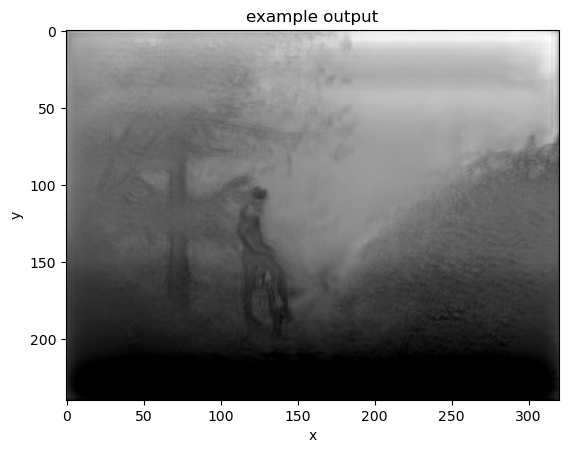

____________________________________________________________________________________________________
Examined samples: 91000 - loss: 52925.1406 - current acc: 0.6737
Examined samples: 92000 - loss: 53448.9570 - current acc: 0.6739
Examined samples: 93000 - loss: 53990.8555 - current acc: 0.6742
Examined samples: 94000 - loss: 54567.9883 - current acc: 0.6743
Examined samples: 95000 - loss: 55196.2969 - current acc: 0.6742
Examined samples: 96000 - loss: 55732.9570 - current acc: 0.6746
Examined samples: 97000 - loss: 56305.5703 - current acc: 0.6748
Examined samples: 98000 - loss: 56878.7891 - current acc: 0.6749
Examined samples: 99000 - loss: 57422.1133 - current acc: 0.6751
Examined samples: 100000 - loss: 57985.9062 - current acc: 0.6753


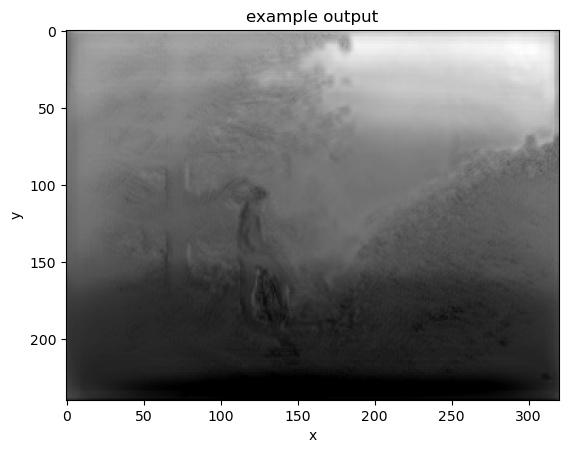

____________________________________________________________________________________________________
Examined samples: 101000 - loss: 58556.0898 - current acc: 0.6755
Examined samples: 102000 - loss: 59103.4219 - current acc: 0.6758
Examined samples: 103000 - loss: 59665.0391 - current acc: 0.6760
Examined samples: 104000 - loss: 60196.4531 - current acc: 0.6764
Examined samples: 105000 - loss: 60758.5430 - current acc: 0.6766
Examined samples: 106000 - loss: 61315.8594 - current acc: 0.6769
Examined samples: 107000 - loss: 61889.6250 - current acc: 0.6770
Examined samples: 108000 - loss: 62453.1914 - current acc: 0.6773
Examined samples: 109000 - loss: 63028.3359 - current acc: 0.6777
Examined samples: 110000 - loss: 63576.2383 - current acc: 0.6780


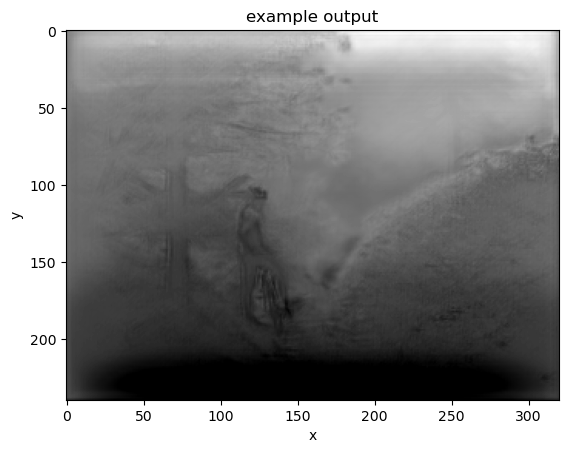

____________________________________________________________________________________________________
Examined samples: 111000 - loss: 64144.3359 - current acc: 0.6782
Examined samples: 112000 - loss: 64695.3867 - current acc: 0.6787
Examined samples: 113000 - loss: 65243.2070 - current acc: 0.6791
Examined samples: 114000 - loss: 65782.1875 - current acc: 0.6795
Examined samples: 115000 - loss: 66380.2109 - current acc: 0.6796
Examined samples: 116000 - loss: 66955.0156 - current acc: 0.6798
Examined samples: 117000 - loss: 67502.4766 - current acc: 0.6801
Examined samples: 118000 - loss: 68080.1328 - current acc: 0.6803
Examined samples: 119000 - loss: 68610.7578 - current acc: 0.6806
Examined samples: 120000 - loss: 69152.9141 - current acc: 0.6809


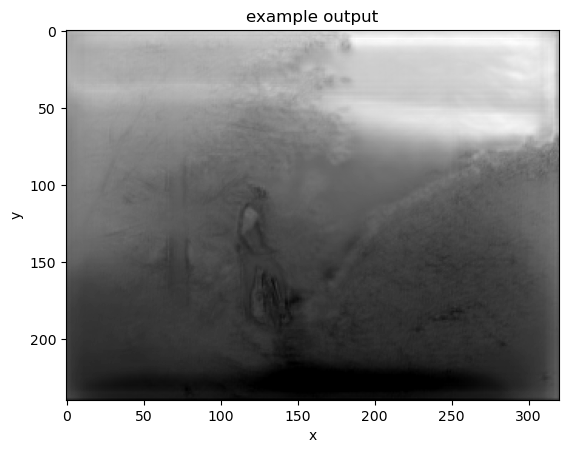

____________________________________________________________________________________________________
Examined samples: 121000 - loss: 69673.4531 - current acc: 0.6814
Examined samples: 122000 - loss: 70251.6172 - current acc: 0.6816
Examined samples: 123000 - loss: 70817.7344 - current acc: 0.6817
Examined samples: 124000 - loss: 71381.7422 - current acc: 0.6819
Examined samples: 125000 - loss: 71915.3672 - current acc: 0.6821
Examined samples: 126000 - loss: 72476.1953 - current acc: 0.6824
Examined samples: 127000 - loss: 73019.3594 - current acc: 0.6826
Examined samples: 128000 - loss: 73565.4688 - current acc: 0.6829
Examined samples: 129000 - loss: 74105.8594 - current acc: 0.6831
Examined samples: 130000 - loss: 74683.2969 - current acc: 0.6833


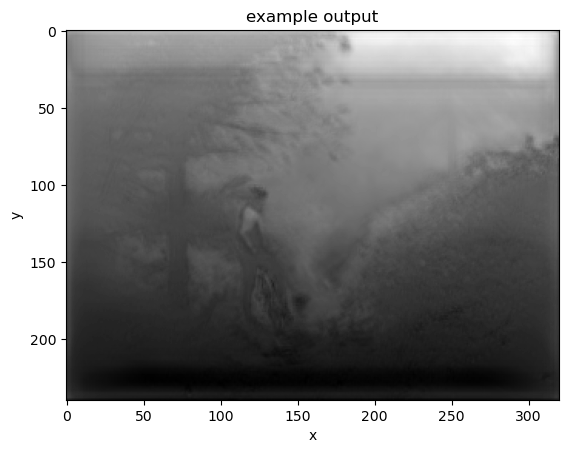

____________________________________________________________________________________________________
Examined samples: 131000 - loss: 75235.4609 - current acc: 0.6836
Examined samples: 132000 - loss: 75799.3516 - current acc: 0.6838
Examined samples: 133000 - loss: 76319.1562 - current acc: 0.6841
Examined samples: 134000 - loss: 76882.8984 - current acc: 0.6843
Examined samples: 135000 - loss: 77423.3828 - current acc: 0.6846
Examined samples: 136000 - loss: 77974.4844 - current acc: 0.6847
Examined samples: 137000 - loss: 78526.1641 - current acc: 0.6850
Examined samples: 138000 - loss: 79031.2656 - current acc: 0.6853
Examined samples: 139000 - loss: 79578.9688 - current acc: 0.6856
Examined samples: 140000 - loss: 80136.3359 - current acc: 0.6858


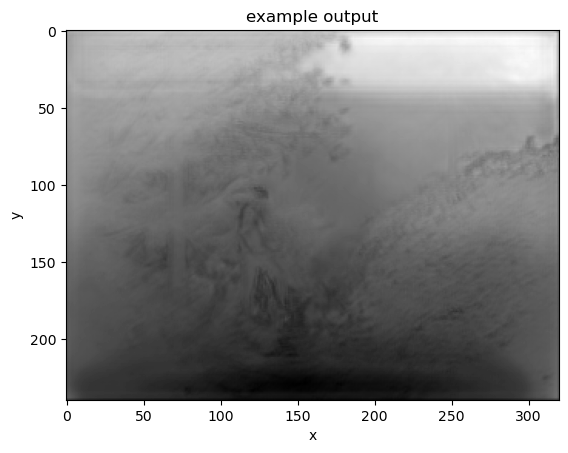

____________________________________________________________________________________________________
Examined samples: 141000 - loss: 80720.4922 - current acc: 0.6860
Examined samples: 142000 - loss: 81297.1406 - current acc: 0.6861
Examined samples: 143000 - loss: 81831.6875 - current acc: 0.6865
Examined samples: 144000 - loss: 82426.8047 - current acc: 0.6867
Examined samples: 145000 - loss: 82977.5391 - current acc: 0.6871
Examined samples: 146000 - loss: 83539.1953 - current acc: 0.6873
Examined samples: 147000 - loss: 84118.1406 - current acc: 0.6875
Examined samples: 148000 - loss: 84661.2891 - current acc: 0.6878
Examined samples: 149000 - loss: 85249.5859 - current acc: 0.6880
Examined samples: 150000 - loss: 85793.3438 - current acc: 0.6883


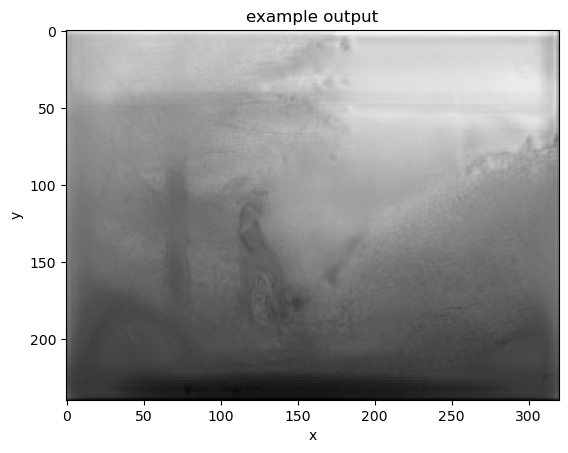

____________________________________________________________________________________________________
Examined samples: 151000 - loss: 86393.9219 - current acc: 0.6883
Examined samples: 152000 - loss: 86966.4375 - current acc: 0.6885
Examined samples: 153000 - loss: 87552.6719 - current acc: 0.6886
Examined samples: 154000 - loss: 88105.3672 - current acc: 0.6888
Examined samples: 155000 - loss: 88629.2500 - current acc: 0.6890
Examined samples: 156000 - loss: 89189.3125 - current acc: 0.6892
Examined samples: 157000 - loss: 89738.0000 - current acc: 0.6895
Examined samples: 158000 - loss: 90323.1953 - current acc: 0.6896
Examined samples: 159000 - loss: 90831.1172 - current acc: 0.6898
Examined samples: 160000 - loss: 91409.2734 - current acc: 0.6901


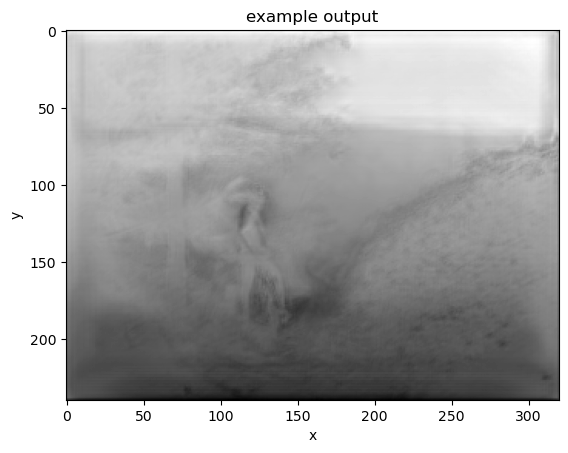

____________________________________________________________________________________________________
Examined samples: 161000 - loss: 91944.1719 - current acc: 0.6904
Examined samples: 162000 - loss: 92453.7422 - current acc: 0.6909
Examined samples: 163000 - loss: 93053.1406 - current acc: 0.6910
Examined samples: 164000 - loss: 93638.7031 - current acc: 0.6912
Examined samples: 165000 - loss: 94202.8906 - current acc: 0.6913
Examined samples: 166000 - loss: 94751.9062 - current acc: 0.6915
Examined samples: 167000 - loss: 95322.6562 - current acc: 0.6916
Examined samples: 168000 - loss: 95910.7188 - current acc: 0.6916
Examined samples: 169000 - loss: 96459.2188 - current acc: 0.6918
Examined samples: 170000 - loss: 97019.3984 - current acc: 0.6920


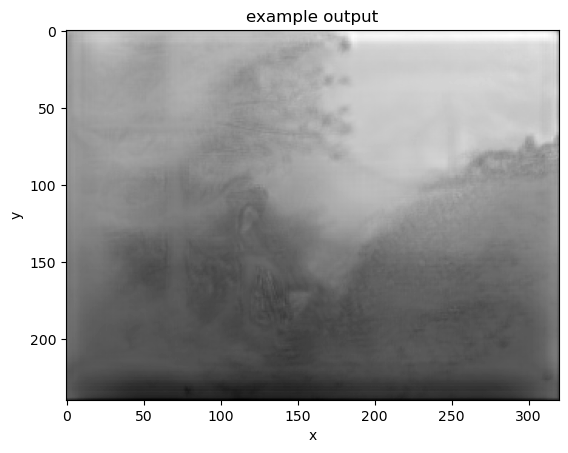

____________________________________________________________________________________________________
Examined samples: 171000 - loss: 97659.0469 - current acc: 0.6920
Examined samples: 172000 - loss: 98220.4219 - current acc: 0.6922
Examined samples: 173000 - loss: 98769.4375 - current acc: 0.6923
Examined samples: 174000 - loss: 99354.7344 - current acc: 0.6924
Examined samples: 175000 - loss: 99964.6094 - current acc: 0.6925
Examined samples: 176000 - loss: 100476.9844 - current acc: 0.6928
Examined samples: 177000 - loss: 101095.5078 - current acc: 0.6929
Examined samples: 178000 - loss: 101714.8750 - current acc: 0.6930
Examined samples: 179000 - loss: 102264.5312 - current acc: 0.6932
Examined samples: 180000 - loss: 102826.0781 - current acc: 0.6935


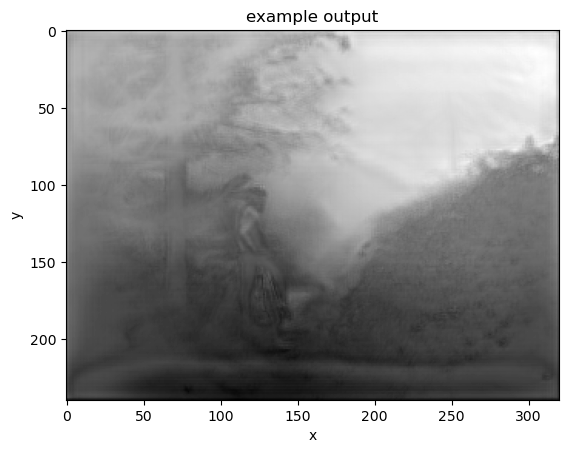

____________________________________________________________________________________________________
Examined samples: 181000 - loss: 103396.5703 - current acc: 0.6937
Examined samples: 182000 - loss: 103936.0312 - current acc: 0.6939
Examined samples: 183000 - loss: 104471.6016 - current acc: 0.6941
Examined samples: 184000 - loss: 105053.0078 - current acc: 0.6942
Examined samples: 185000 - loss: 105629.5000 - current acc: 0.6943
Examined samples: 186000 - loss: 106170.5312 - current acc: 0.6946
Examined samples: 187000 - loss: 106721.2734 - current acc: 0.6948
Examined samples: 188000 - loss: 107280.7188 - current acc: 0.6949
Examined samples: 189000 - loss: 107880.9141 - current acc: 0.6949
Examined samples: 190000 - loss: 108432.5547 - current acc: 0.6950


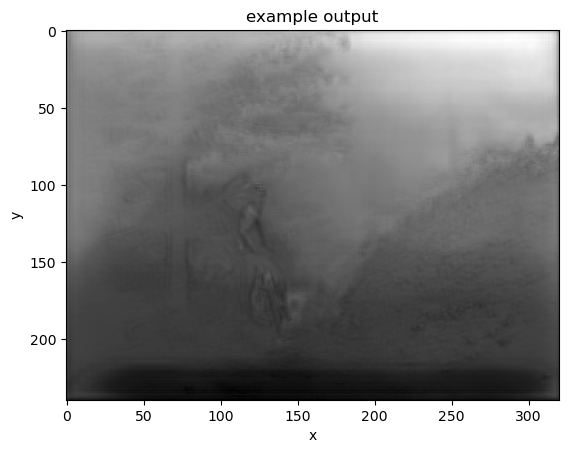

____________________________________________________________________________________________________
Examined samples: 191000 - loss: 109017.2188 - current acc: 0.6951
Examined samples: 192000 - loss: 109572.2422 - current acc: 0.6952
Examined samples: 193000 - loss: 110175.5312 - current acc: 0.6953
Examined samples: 194000 - loss: 110724.8750 - current acc: 0.6954
Examined samples: 195000 - loss: 111273.0469 - current acc: 0.6956
Examined samples: 196000 - loss: 111834.5469 - current acc: 0.6957
Examined samples: 197000 - loss: 112345.3438 - current acc: 0.6959
Examined samples: 198000 - loss: 112898.2500 - current acc: 0.6960
Examined samples: 199000 - loss: 113468.2344 - current acc: 0.6962
Examined samples: 200000 - loss: 113982.2891 - current acc: 0.6965


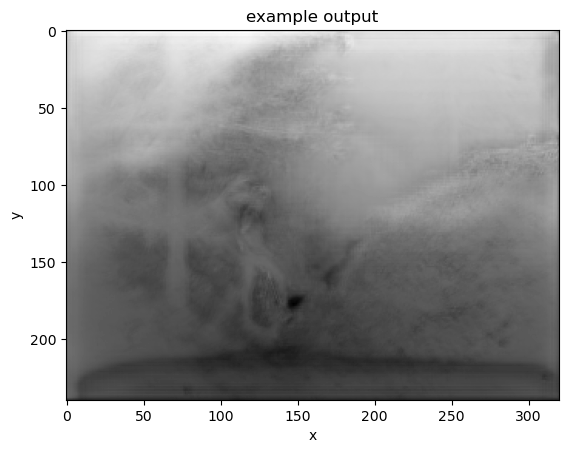

____________________________________________________________________________________________________
Examined samples: 201000 - loss: 114548.1953 - current acc: 0.6967
Examined samples: 202000 - loss: 115119.0234 - current acc: 0.6968
Examined samples: 203000 - loss: 115658.2734 - current acc: 0.6970
Examined samples: 204000 - loss: 116202.4141 - current acc: 0.6972
Examined samples: 205000 - loss: 116783.9922 - current acc: 0.6974
Examined samples: 206000 - loss: 117364.1172 - current acc: 0.6974
Examined samples: 207000 - loss: 117950.3281 - current acc: 0.6974
Examined samples: 208000 - loss: 118551.7578 - current acc: 0.6975
Examined samples: 209000 - loss: 119122.9297 - current acc: 0.6976
Examined samples: 210000 - loss: 119685.4141 - current acc: 0.6977


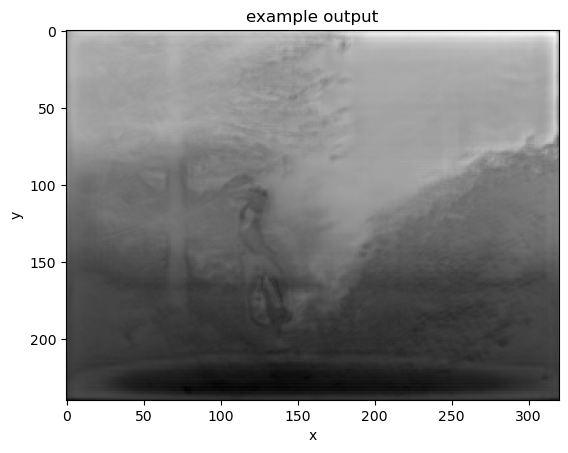

____________________________________________________________________________________________________
Examined samples: 211000 - loss: 120243.4453 - current acc: 0.6979
Examined samples: 212000 - loss: 120810.1094 - current acc: 0.6980
Examined samples: 213000 - loss: 121397.0859 - current acc: 0.6980
Examined samples: 214000 - loss: 121960.6562 - current acc: 0.6981
Examined samples: 215000 - loss: 122529.3906 - current acc: 0.6983
Examined samples: 216000 - loss: 123084.5938 - current acc: 0.6985
Examined samples: 217000 - loss: 123659.9141 - current acc: 0.6985
Examined samples: 218000 - loss: 124242.0312 - current acc: 0.6986
Examined samples: 219000 - loss: 124743.1328 - current acc: 0.6988
Examined samples: 220000 - loss: 125311.7109 - current acc: 0.6990


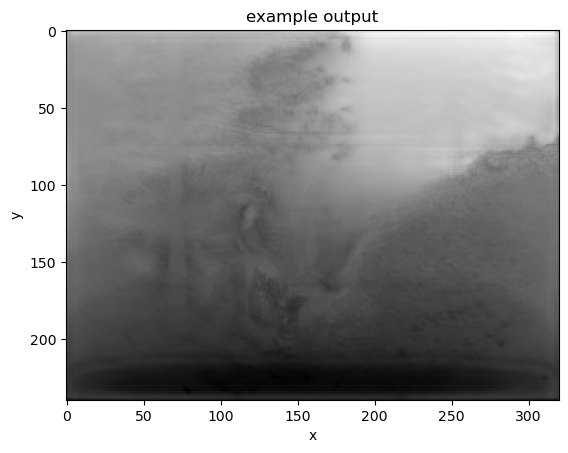

____________________________________________________________________________________________________
Examined samples: 221000 - loss: 125862.9141 - current acc: 0.6991
Examined samples: 222000 - loss: 126422.1875 - current acc: 0.6993
Examined samples: 223000 - loss: 127023.0078 - current acc: 0.6993
Examined samples: 224000 - loss: 127598.3359 - current acc: 0.6994
Examined samples: 225000 - loss: 128139.2812 - current acc: 0.6995
Examined samples: 226000 - loss: 128726.4766 - current acc: 0.6996
Examined samples: 227000 - loss: 129263.7500 - current acc: 0.6997
Examined samples: 228000 - loss: 129857.2109 - current acc: 0.6997
Examined samples: 229000 - loss: 130427.2188 - current acc: 0.6997
Examined samples: 230000 - loss: 131014.1328 - current acc: 0.6997


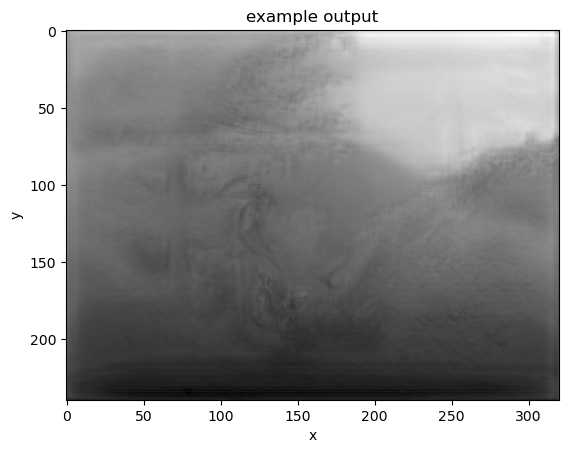

____________________________________________________________________________________________________
Examined samples: 231000 - loss: 131533.7500 - current acc: 0.6999
Examined samples: 232000 - loss: 132123.8750 - current acc: 0.7000
Examined samples: 233000 - loss: 132627.5000 - current acc: 0.7002
Examined samples: 234000 - loss: 133208.7500 - current acc: 0.7003
Examined samples: 235000 - loss: 133767.6719 - current acc: 0.7005
Examined samples: 236000 - loss: 134336.5781 - current acc: 0.7006
Examined samples: 237000 - loss: 134943.2812 - current acc: 0.7006
Examined samples: 238000 - loss: 135496.9219 - current acc: 0.7007
Examined samples: 239000 - loss: 136107.6406 - current acc: 0.7007
Examined samples: 240000 - loss: 136697.1250 - current acc: 0.7007


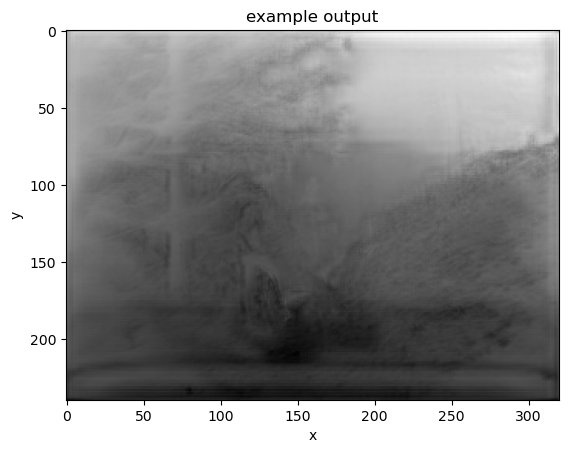

____________________________________________________________________________________________________
Examined samples: 241000 - loss: 137266.3594 - current acc: 0.7009
Examined samples: 242000 - loss: 137870.0625 - current acc: 0.7009
Examined samples: 243000 - loss: 138427.8750 - current acc: 0.7010
Examined samples: 244000 - loss: 139043.5781 - current acc: 0.7010
Examined samples: 245000 - loss: 139613.1094 - current acc: 0.7011
Examined samples: 246000 - loss: 140204.8281 - current acc: 0.7012
Examined samples: 247000 - loss: 140752.6562 - current acc: 0.7013
Examined samples: 248000 - loss: 141303.4531 - current acc: 0.7014
Examined samples: 249000 - loss: 141822.0469 - current acc: 0.7015
Examined samples: 250000 - loss: 142410.5625 - current acc: 0.7016


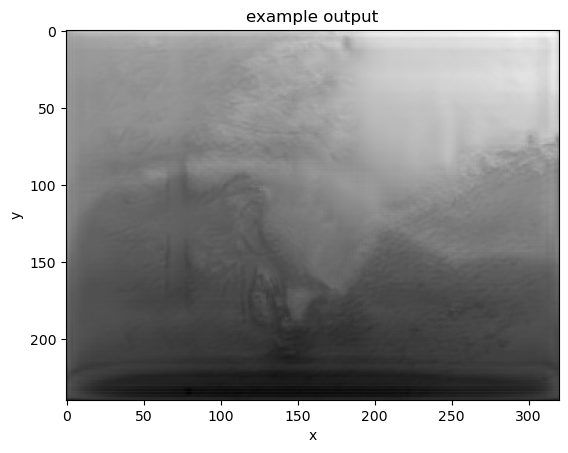

____________________________________________________________________________________________________
Examined samples: 251000 - loss: 142979.9219 - current acc: 0.7017
Examined samples: 252000 - loss: 143546.7031 - current acc: 0.7018
Examined samples: 253000 - loss: 144076.6406 - current acc: 0.7019
Examined samples: 254000 - loss: 144719.2500 - current acc: 0.7020
Examined samples: 255000 - loss: 145281.0469 - current acc: 0.7022
Examined samples: 256000 - loss: 145869.3281 - current acc: 0.7022
Examined samples: 257000 - loss: 146439.3281 - current acc: 0.7023
Examined samples: 258000 - loss: 147000.5938 - current acc: 0.7025
Examined samples: 259000 - loss: 147557.2812 - current acc: 0.7026
Examined samples: 260000 - loss: 148152.3594 - current acc: 0.7027


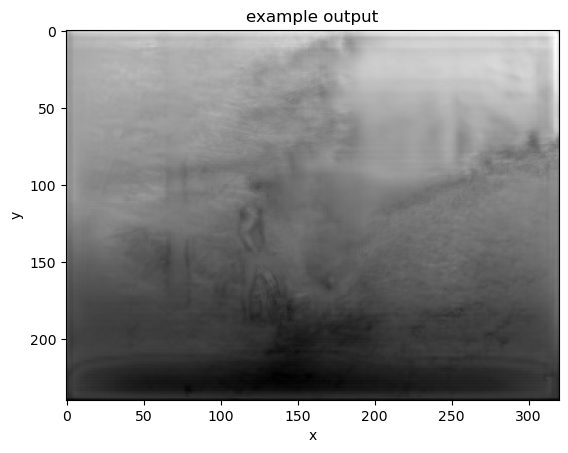

____________________________________________________________________________________________________
Examined samples: 261000 - loss: 148778.2969 - current acc: 0.7026
Examined samples: 262000 - loss: 149329.9062 - current acc: 0.7027
Examined samples: 263000 - loss: 149884.7031 - current acc: 0.7028
Examined samples: 264000 - loss: 150482.7500 - current acc: 0.7028
Examined samples: 265000 - loss: 151052.5781 - current acc: 0.7029
Examined samples: 266000 - loss: 151598.7969 - current acc: 0.7029
Examined samples: 267000 - loss: 152132.0938 - current acc: 0.7031
Examined samples: 268000 - loss: 152679.1094 - current acc: 0.7032
Examined samples: 269000 - loss: 153197.8750 - current acc: 0.7033
Examined samples: 270000 - loss: 153816.4844 - current acc: 0.7033


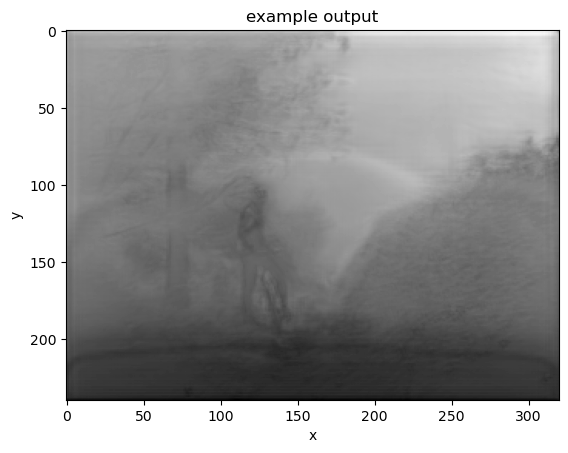

____________________________________________________________________________________________________
Examined samples: 271000 - loss: 154370.5469 - current acc: 0.7034
Examined samples: 272000 - loss: 154930.6406 - current acc: 0.7034
Examined samples: 273000 - loss: 155492.6250 - current acc: 0.7035
Examined samples: 274000 - loss: 156050.6875 - current acc: 0.7035
Examined samples: 275000 - loss: 156566.4375 - current acc: 0.7037
Examined samples: 276000 - loss: 157160.0312 - current acc: 0.7038
Examined samples: 277000 - loss: 157756.7188 - current acc: 0.7038
Examined samples: 278000 - loss: 158312.3750 - current acc: 0.7038
Examined samples: 279000 - loss: 158883.2656 - current acc: 0.7039
Examined samples: 280000 - loss: 159433.9219 - current acc: 0.7040


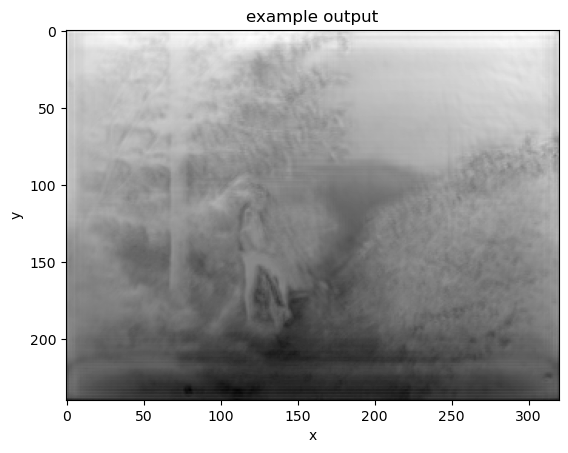

____________________________________________________________________________________________________
Examined samples: 281000 - loss: 159981.5469 - current acc: 0.7040
Examined samples: 282000 - loss: 160537.3750 - current acc: 0.7041
Examined samples: 283000 - loss: 161085.9062 - current acc: 0.7042
Examined samples: 284000 - loss: 161662.9375 - current acc: 0.7042
Examined samples: 285000 - loss: 162200.7969 - current acc: 0.7043
Examined samples: 286000 - loss: 162766.3906 - current acc: 0.7045
Examined samples: 287000 - loss: 163329.3281 - current acc: 0.7046
Examined samples: 288000 - loss: 163910.8125 - current acc: 0.7046
Examined samples: 289000 - loss: 164546.0000 - current acc: 0.7046
Examined samples: 290000 - loss: 165084.9844 - current acc: 0.7046


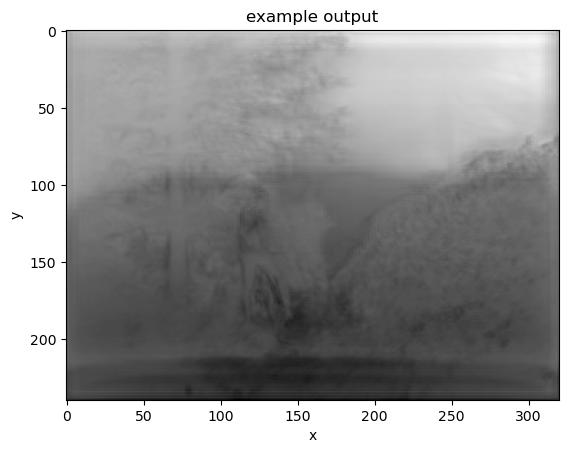

____________________________________________________________________________________________________
Examined samples: 291000 - loss: 165652.7031 - current acc: 0.7047
Examined samples: 292000 - loss: 166224.2812 - current acc: 0.7048
Examined samples: 293000 - loss: 166784.1250 - current acc: 0.7048
Examined samples: 294000 - loss: 167341.7031 - current acc: 0.7049
Examined samples: 295000 - loss: 167888.0625 - current acc: 0.7049
Examined samples: 296000 - loss: 168463.0781 - current acc: 0.7050
Examined samples: 297000 - loss: 169055.8281 - current acc: 0.7050
Examined samples: 298000 - loss: 169600.6875 - current acc: 0.7051
Examined samples: 299000 - loss: 170161.3438 - current acc: 0.7052
Examined samples: 300000 - loss: 170696.3438 - current acc: 0.7053


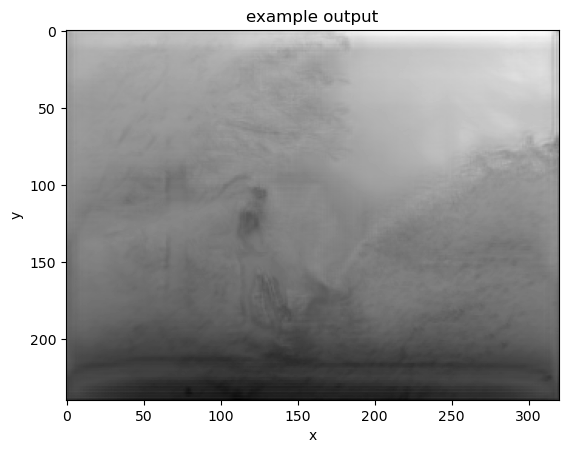

____________________________________________________________________________________________________
Examined samples: 301000 - loss: 171225.5000 - current acc: 0.7054
Examined samples: 302000 - loss: 171737.7656 - current acc: 0.7056
Examined samples: 303000 - loss: 172320.9531 - current acc: 0.7056
Examined samples: 304000 - loss: 172857.1406 - current acc: 0.7057
Examined samples: 305000 - loss: 173434.1562 - current acc: 0.7058
Examined samples: 306000 - loss: 173988.6562 - current acc: 0.7059
Examined samples: 307000 - loss: 174535.6094 - current acc: 0.7060
Examined samples: 308000 - loss: 175124.4688 - current acc: 0.7060
Examined samples: 309000 - loss: 175675.7500 - current acc: 0.7060
Examined samples: 310000 - loss: 176256.1094 - current acc: 0.7061


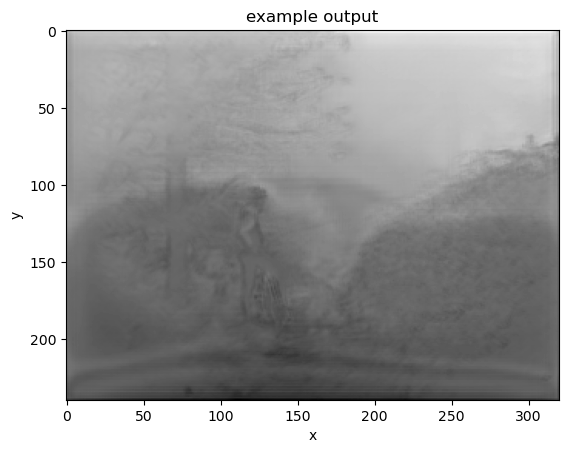

____________________________________________________________________________________________________
Examined samples: 311000 - loss: 176786.7969 - current acc: 0.7062
Examined samples: 312000 - loss: 177340.7812 - current acc: 0.7063
Examined samples: 313000 - loss: 177905.7656 - current acc: 0.7063
Examined samples: 314000 - loss: 178427.6875 - current acc: 0.7064
Examined samples: 315000 - loss: 178980.5312 - current acc: 0.7065
Examined samples: 316000 - loss: 179449.7031 - current acc: 0.7067
Examined samples: 317000 - loss: 180044.2812 - current acc: 0.7067
Examined samples: 318000 - loss: 180637.7031 - current acc: 0.7068
Examined samples: 319000 - loss: 181190.9844 - current acc: 0.7069
Examined samples: 320000 - loss: 181776.7344 - current acc: 0.7070


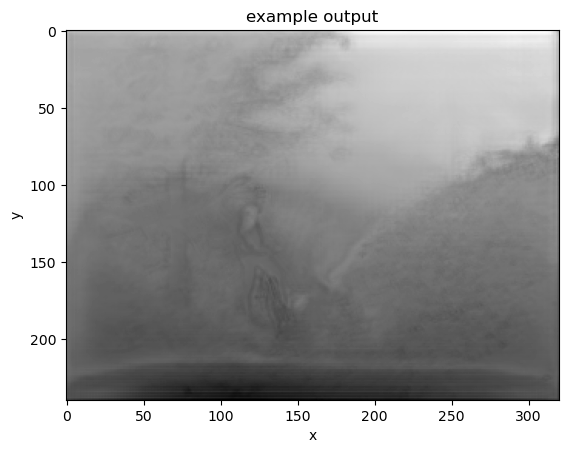

____________________________________________________________________________________________________
Examined samples: 321000 - loss: 182355.1250 - current acc: 0.7070
Examined samples: 322000 - loss: 182871.6094 - current acc: 0.7071
Examined samples: 323000 - loss: 183455.0625 - current acc: 0.7072
Examined samples: 324000 - loss: 184025.8750 - current acc: 0.7073
Examined samples: 325000 - loss: 184589.2188 - current acc: 0.7073
Examined samples: 326000 - loss: 185139.2969 - current acc: 0.7074
Examined samples: 327000 - loss: 185675.1250 - current acc: 0.7075
Examined samples: 328000 - loss: 186238.4219 - current acc: 0.7075
Examined samples: 329000 - loss: 186790.9062 - current acc: 0.7076
Examined samples: 330000 - loss: 187378.0781 - current acc: 0.7077


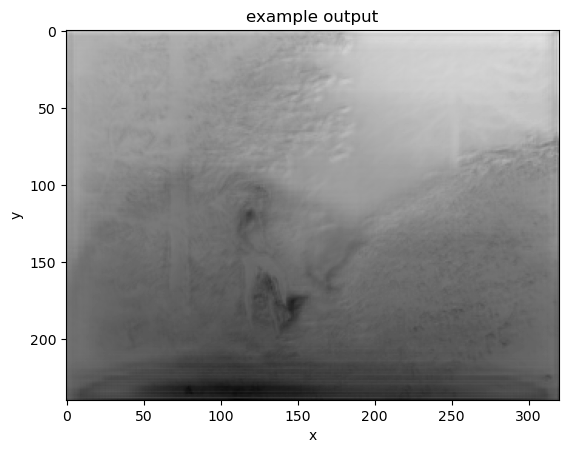

____________________________________________________________________________________________________
Examined samples: 331000 - loss: 187906.8125 - current acc: 0.7077
Examined samples: 332000 - loss: 188489.0625 - current acc: 0.7078
Examined samples: 333000 - loss: 189051.0000 - current acc: 0.7079
Examined samples: 334000 - loss: 189577.3125 - current acc: 0.7079
Examined samples: 335000 - loss: 190202.2344 - current acc: 0.7079
Examined samples: 336000 - loss: 190766.5312 - current acc: 0.7079
Examined samples: 337000 - loss: 191292.8906 - current acc: 0.7081
Examined samples: 338000 - loss: 191860.2812 - current acc: 0.7081
Examined samples: 339000 - loss: 192430.0625 - current acc: 0.7081
Examined samples: 340000 - loss: 192986.3281 - current acc: 0.7082


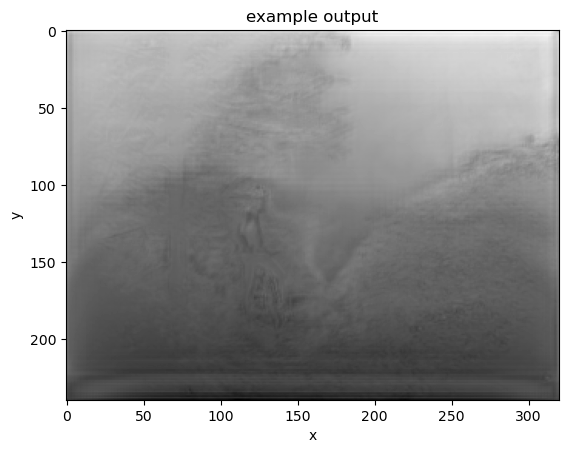

____________________________________________________________________________________________________
Examined samples: 341000 - loss: 193589.8438 - current acc: 0.7082
Examined samples: 342000 - loss: 194170.5156 - current acc: 0.7082
Examined samples: 343000 - loss: 194705.9219 - current acc: 0.7082
Examined samples: 344000 - loss: 195264.4375 - current acc: 0.7083
Examined samples: 345000 - loss: 195833.3281 - current acc: 0.7083
Examined samples: 346000 - loss: 196388.5781 - current acc: 0.7084
Examined samples: 347000 - loss: 196974.4375 - current acc: 0.7085
Examined samples: 348000 - loss: 197549.3125 - current acc: 0.7085
Examined samples: 349000 - loss: 198092.7812 - current acc: 0.7086
Examined samples: 350000 - loss: 198647.7344 - current acc: 0.7086


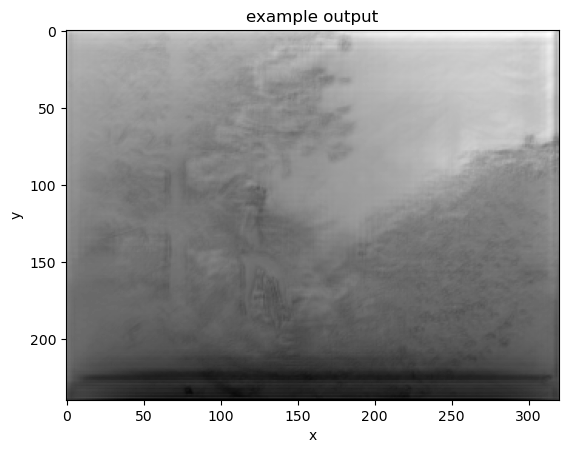

____________________________________________________________________________________________________
Examined samples: 351000 - loss: 199165.8594 - current acc: 0.7088
Examined samples: 352000 - loss: 199712.2969 - current acc: 0.7089
Examined samples: 353000 - loss: 200287.6094 - current acc: 0.7089
Examined samples: 354000 - loss: 200859.4844 - current acc: 0.7090
Examined samples: 355000 - loss: 201405.4844 - current acc: 0.7090
Examined samples: 356000 - loss: 201943.9062 - current acc: 0.7091
Examined samples: 357000 - loss: 202517.3281 - current acc: 0.7091
Examined samples: 358000 - loss: 203115.7188 - current acc: 0.7092
Examined samples: 359000 - loss: 203714.1875 - current acc: 0.7092
Examined samples: 360000 - loss: 204216.9062 - current acc: 0.7093


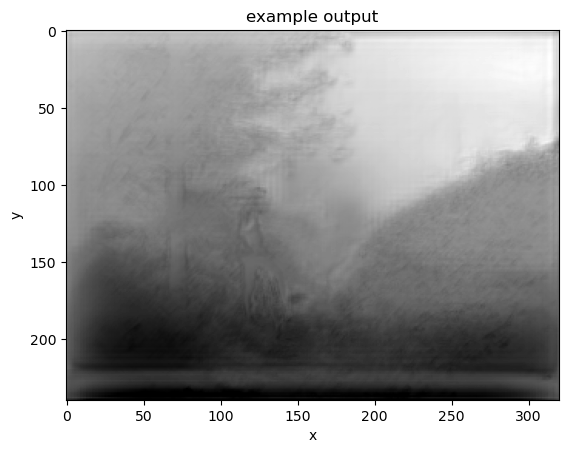

____________________________________________________________________________________________________
Examined samples: 361000 - loss: 204811.3906 - current acc: 0.7094
Examined samples: 362000 - loss: 205339.5469 - current acc: 0.7095
Examined samples: 363000 - loss: 205970.2188 - current acc: 0.7094
Examined samples: 364000 - loss: 206544.4531 - current acc: 0.7095
Examined samples: 365000 - loss: 207101.5312 - current acc: 0.7096
Examined samples: 366000 - loss: 207705.8906 - current acc: 0.7095
Examined samples: 367000 - loss: 208270.0312 - current acc: 0.7096
Examined samples: 368000 - loss: 208807.6719 - current acc: 0.7097
Examined samples: 369000 - loss: 209364.1719 - current acc: 0.7097
Examined samples: 370000 - loss: 209951.8438 - current acc: 0.7097


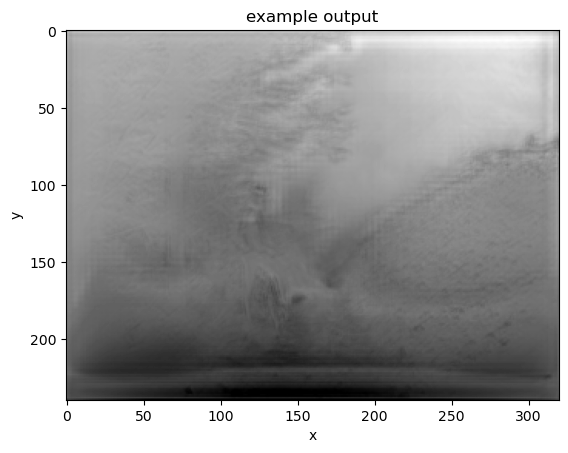

____________________________________________________________________________________________________
Examined samples: 371000 - loss: 210540.5156 - current acc: 0.7098
Examined samples: 372000 - loss: 211117.0000 - current acc: 0.7098
Examined samples: 373000 - loss: 211659.9844 - current acc: 0.7098
Examined samples: 374000 - loss: 212216.2656 - current acc: 0.7099
Examined samples: 375000 - loss: 212792.4844 - current acc: 0.7099
Examined samples: 376000 - loss: 213364.0625 - current acc: 0.7100
Examined samples: 377000 - loss: 213924.5781 - current acc: 0.7100
Examined samples: 378000 - loss: 214485.2344 - current acc: 0.7101
Examined samples: 379000 - loss: 215059.3438 - current acc: 0.7101
Examined samples: 380000 - loss: 215576.5312 - current acc: 0.7102


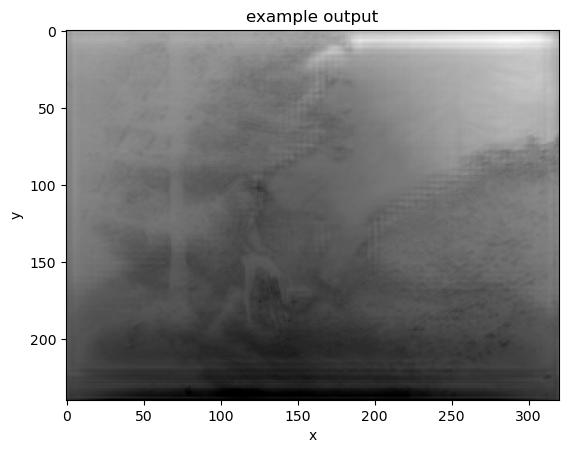

____________________________________________________________________________________________________
Examined samples: 381000 - loss: 216166.9844 - current acc: 0.7102
Examined samples: 382000 - loss: 216753.3594 - current acc: 0.7102
Examined samples: 383000 - loss: 217325.5938 - current acc: 0.7103
Examined samples: 384000 - loss: 217895.4844 - current acc: 0.7103
Examined samples: 385000 - loss: 218442.4844 - current acc: 0.7104
Examined samples: 386000 - loss: 218998.3750 - current acc: 0.7104
Examined samples: 387000 - loss: 219536.0469 - current acc: 0.7105
Examined samples: 388000 - loss: 220106.9219 - current acc: 0.7105
Examined samples: 389000 - loss: 220676.4688 - current acc: 0.7105
Examined samples: 390000 - loss: 221243.8750 - current acc: 0.7105


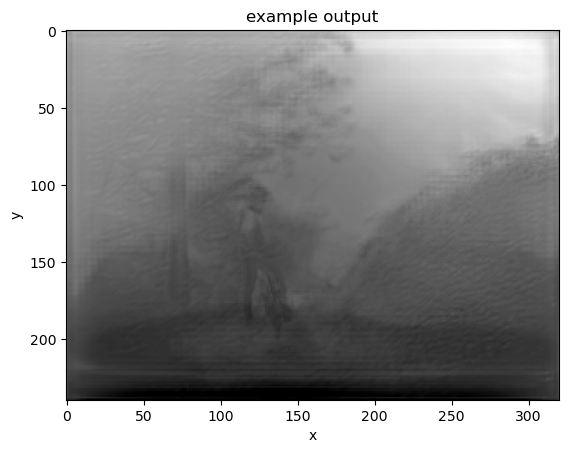

____________________________________________________________________________________________________
Examined samples: 391000 - loss: 221822.1562 - current acc: 0.7105
Examined samples: 392000 - loss: 222380.7188 - current acc: 0.7106
Examined samples: 393000 - loss: 222906.4219 - current acc: 0.7107
Examined samples: 394000 - loss: 223452.7188 - current acc: 0.7107
Examined samples: 395000 - loss: 223991.8750 - current acc: 0.7109
Examined samples: 396000 - loss: 224558.1875 - current acc: 0.7109
Examined samples: 397000 - loss: 225117.3750 - current acc: 0.7110
Examined samples: 398000 - loss: 225701.2500 - current acc: 0.7110
Examined samples: 399000 - loss: 226257.2031 - current acc: 0.7111
Examined samples: 400000 - loss: 226824.0938 - current acc: 0.7111


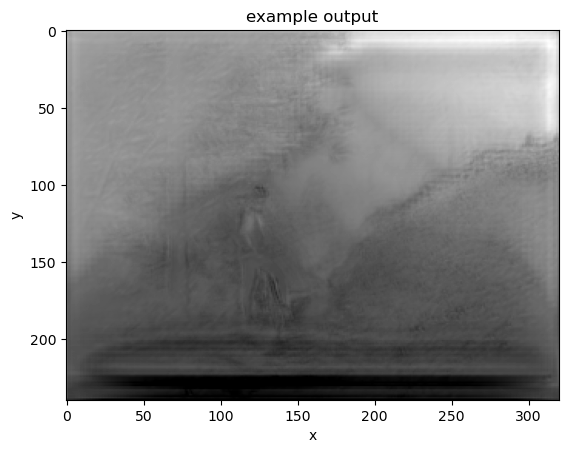

____________________________________________________________________________________________________
Examined samples: 401000 - loss: 227396.4531 - current acc: 0.7112
Examined samples: 402000 - loss: 227977.4844 - current acc: 0.7113
Examined samples: 403000 - loss: 228565.5469 - current acc: 0.7113
Examined samples: 404000 - loss: 229138.0156 - current acc: 0.7113
train_loss: 229608.8281 - train_accuracy: 0.7114
Epoch 1 ends in 58554 seconds.
Epoch 2/2:
Examined samples: 1000 - loss: 560.4837 - current acc: 0.7230


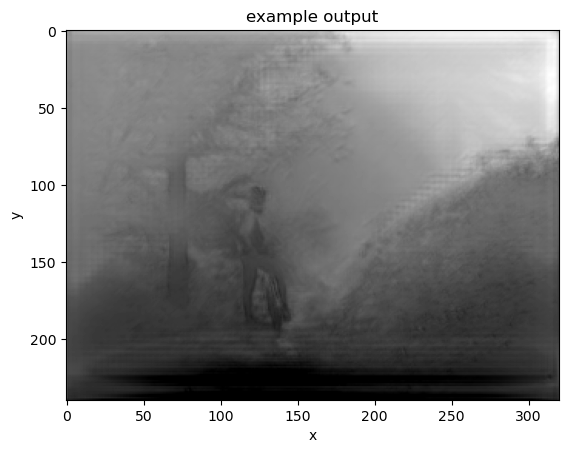

____________________________________________________________________________________________________
Examined samples: 2000 - loss: 1130.8357 - current acc: 0.7290
Examined samples: 3000 - loss: 1708.9790 - current acc: 0.7260
Examined samples: 4000 - loss: 2251.1001 - current acc: 0.7245
Examined samples: 5000 - loss: 2813.8069 - current acc: 0.7246
Examined samples: 6000 - loss: 3411.2559 - current acc: 0.7192
Examined samples: 7000 - loss: 3937.6265 - current acc: 0.7197
Examined samples: 8000 - loss: 4497.0527 - current acc: 0.7232
Examined samples: 9000 - loss: 5089.5986 - current acc: 0.7197
Examined samples: 10000 - loss: 5621.4927 - current acc: 0.7214


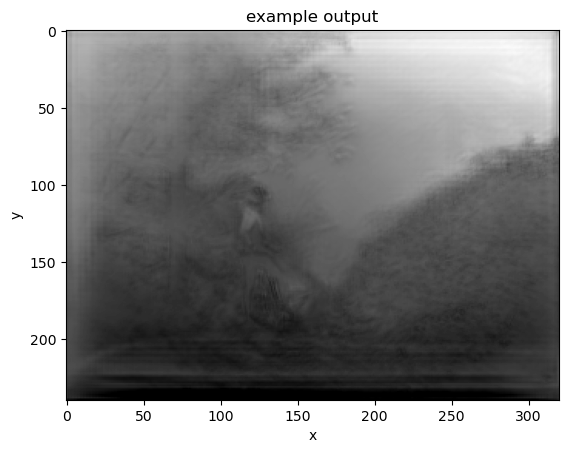

____________________________________________________________________________________________________
Examined samples: 11000 - loss: 6171.6460 - current acc: 0.7217
Examined samples: 12000 - loss: 6727.7275 - current acc: 0.7226
Examined samples: 13000 - loss: 7280.7671 - current acc: 0.7244
Examined samples: 14000 - loss: 7835.2632 - current acc: 0.7258
Examined samples: 15000 - loss: 8340.4092 - current acc: 0.7269
Examined samples: 16000 - loss: 8892.4561 - current acc: 0.7268
Examined samples: 17000 - loss: 9480.0586 - current acc: 0.7249
Examined samples: 18000 - loss: 10012.5127 - current acc: 0.7256
Examined samples: 19000 - loss: 10575.9658 - current acc: 0.7253
Examined samples: 20000 - loss: 11119.2363 - current acc: 0.7268


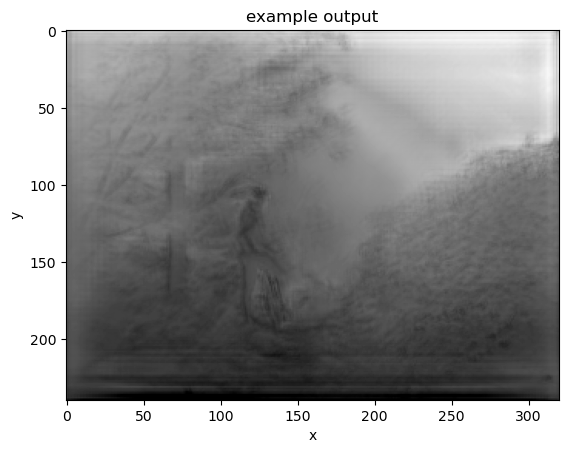

____________________________________________________________________________________________________
Examined samples: 21000 - loss: 11682.6904 - current acc: 0.7268
Examined samples: 22000 - loss: 12206.4258 - current acc: 0.7270
Examined samples: 23000 - loss: 12753.9414 - current acc: 0.7263
Examined samples: 24000 - loss: 13282.5986 - current acc: 0.7266
Examined samples: 25000 - loss: 13842.6553 - current acc: 0.7269
Examined samples: 26000 - loss: 14414.4639 - current acc: 0.7271
Examined samples: 27000 - loss: 14976.9414 - current acc: 0.7278
Examined samples: 28000 - loss: 15542.0977 - current acc: 0.7272
Examined samples: 29000 - loss: 16105.6299 - current acc: 0.7271
Examined samples: 30000 - loss: 16678.4004 - current acc: 0.7273


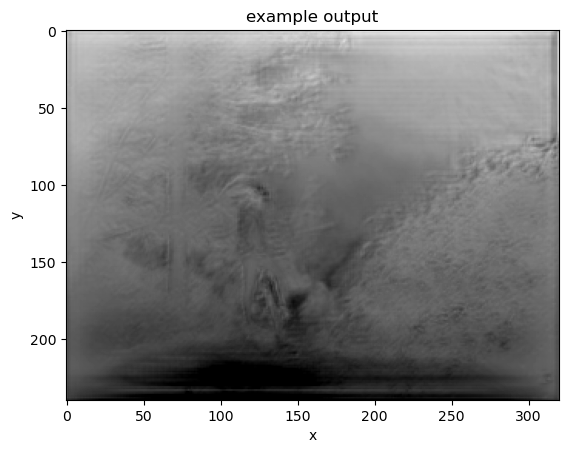

____________________________________________________________________________________________________
Examined samples: 31000 - loss: 17237.7949 - current acc: 0.7271
Examined samples: 32000 - loss: 17792.4551 - current acc: 0.7265
Examined samples: 33000 - loss: 18287.5352 - current acc: 0.7273
Examined samples: 34000 - loss: 18823.7910 - current acc: 0.7274
Examined samples: 35000 - loss: 19350.5410 - current acc: 0.7274
Examined samples: 36000 - loss: 19908.5957 - current acc: 0.7271
Examined samples: 37000 - loss: 20458.7480 - current acc: 0.7274
Examined samples: 38000 - loss: 21009.6172 - current acc: 0.7276
Examined samples: 39000 - loss: 21542.2520 - current acc: 0.7280
Examined samples: 40000 - loss: 22053.2793 - current acc: 0.7286


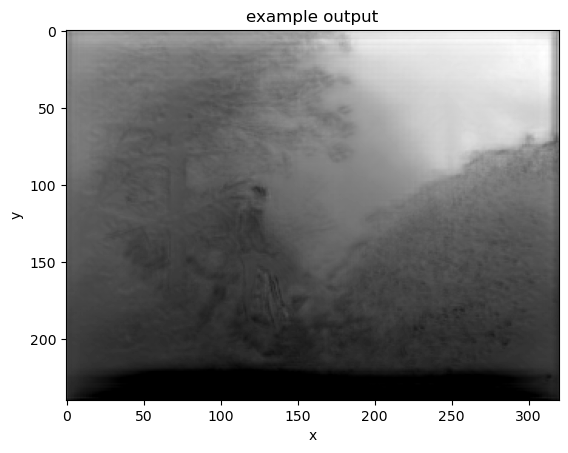

____________________________________________________________________________________________________
Examined samples: 41000 - loss: 22627.0547 - current acc: 0.7284
Examined samples: 42000 - loss: 23173.2227 - current acc: 0.7285
Examined samples: 43000 - loss: 23684.1230 - current acc: 0.7287
Examined samples: 44000 - loss: 24259.8672 - current acc: 0.7283
Examined samples: 45000 - loss: 24799.6309 - current acc: 0.7291
Examined samples: 46000 - loss: 25320.6699 - current acc: 0.7291
Examined samples: 47000 - loss: 25864.9961 - current acc: 0.7296
Examined samples: 48000 - loss: 26455.7598 - current acc: 0.7295
Examined samples: 49000 - loss: 27016.9512 - current acc: 0.7289
Examined samples: 50000 - loss: 27583.1152 - current acc: 0.7291


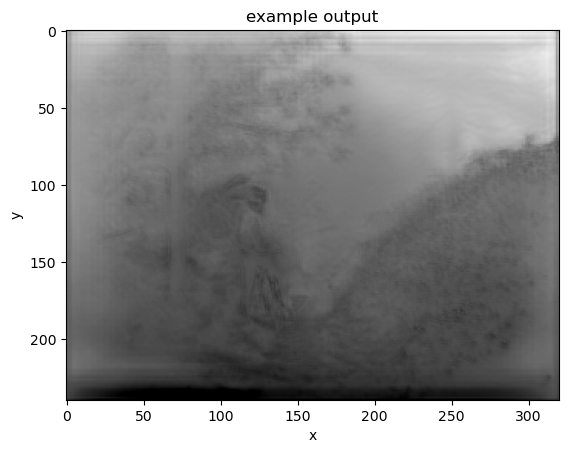

____________________________________________________________________________________________________
Examined samples: 51000 - loss: 28108.0723 - current acc: 0.7293
Examined samples: 52000 - loss: 28629.2734 - current acc: 0.7294
Examined samples: 53000 - loss: 29192.0410 - current acc: 0.7292
Examined samples: 54000 - loss: 29785.8125 - current acc: 0.7290
Examined samples: 55000 - loss: 30292.4375 - current acc: 0.7295
Examined samples: 56000 - loss: 30901.8965 - current acc: 0.7292
Examined samples: 57000 - loss: 31416.5527 - current acc: 0.7292
Examined samples: 58000 - loss: 31984.9512 - current acc: 0.7292
Examined samples: 59000 - loss: 32514.2246 - current acc: 0.7296
Examined samples: 60000 - loss: 33102.5547 - current acc: 0.7294


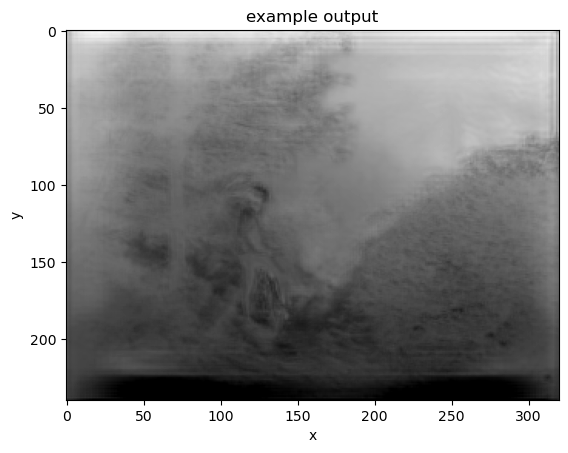

____________________________________________________________________________________________________
Examined samples: 61000 - loss: 33651.7773 - current acc: 0.7294
Examined samples: 62000 - loss: 34205.8203 - current acc: 0.7291
Examined samples: 63000 - loss: 34765.0117 - current acc: 0.7290
Examined samples: 64000 - loss: 35299.4375 - current acc: 0.7290
Examined samples: 65000 - loss: 35833.8164 - current acc: 0.7292
Examined samples: 66000 - loss: 36422.3867 - current acc: 0.7287
Examined samples: 67000 - loss: 37011.4180 - current acc: 0.7285
Examined samples: 68000 - loss: 37585.2461 - current acc: 0.7283
Examined samples: 69000 - loss: 38127.0703 - current acc: 0.7285
Examined samples: 70000 - loss: 38672.5430 - current acc: 0.7288


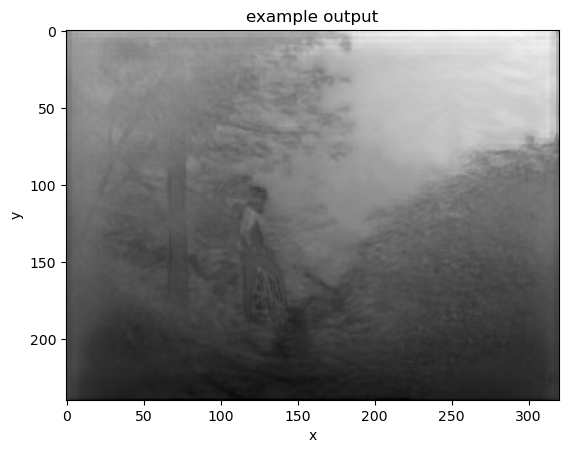

____________________________________________________________________________________________________
Examined samples: 71000 - loss: 39214.9297 - current acc: 0.7289
Examined samples: 72000 - loss: 39779.6016 - current acc: 0.7289
Examined samples: 73000 - loss: 40393.1094 - current acc: 0.7287
Examined samples: 74000 - loss: 40946.0195 - current acc: 0.7290
Examined samples: 75000 - loss: 41465.5625 - current acc: 0.7289
Examined samples: 76000 - loss: 42029.8984 - current acc: 0.7291
Examined samples: 77000 - loss: 42524.1523 - current acc: 0.7296
Examined samples: 78000 - loss: 43064.5391 - current acc: 0.7296
Examined samples: 79000 - loss: 43642.6602 - current acc: 0.7296
Examined samples: 80000 - loss: 44244.1289 - current acc: 0.7295


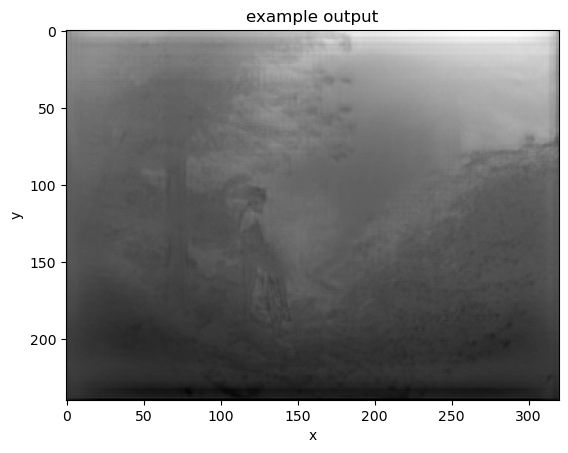

____________________________________________________________________________________________________
Examined samples: 81000 - loss: 44803.9688 - current acc: 0.7297
Examined samples: 82000 - loss: 45392.3281 - current acc: 0.7295
Examined samples: 83000 - loss: 45930.6133 - current acc: 0.7295
Examined samples: 84000 - loss: 46443.8477 - current acc: 0.7299
Examined samples: 85000 - loss: 46966.5586 - current acc: 0.7301
Examined samples: 86000 - loss: 47535.0078 - current acc: 0.7299
Examined samples: 87000 - loss: 48110.8203 - current acc: 0.7296
Examined samples: 88000 - loss: 48672.7227 - current acc: 0.7296
Examined samples: 89000 - loss: 49223.0938 - current acc: 0.7297
Examined samples: 90000 - loss: 49812.0547 - current acc: 0.7295


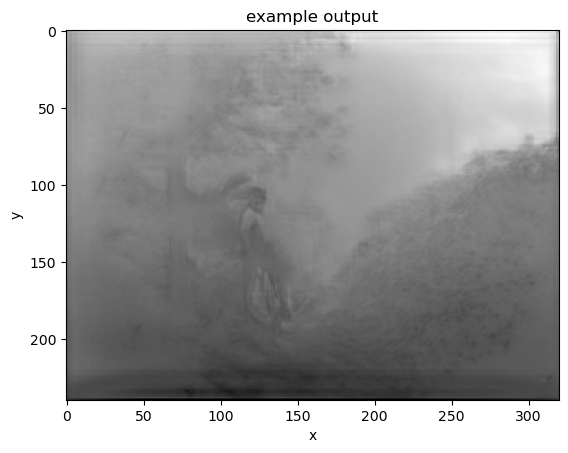

____________________________________________________________________________________________________
Examined samples: 91000 - loss: 50392.2266 - current acc: 0.7294
Examined samples: 92000 - loss: 50952.6602 - current acc: 0.7293
Examined samples: 93000 - loss: 51490.2773 - current acc: 0.7294
Examined samples: 94000 - loss: 52067.4883 - current acc: 0.7295
Examined samples: 95000 - loss: 52608.2578 - current acc: 0.7295
Examined samples: 96000 - loss: 53112.1406 - current acc: 0.7297
Examined samples: 97000 - loss: 53708.4766 - current acc: 0.7294
Examined samples: 98000 - loss: 54279.0938 - current acc: 0.7294
Examined samples: 99000 - loss: 54839.5781 - current acc: 0.7296
Examined samples: 100000 - loss: 55372.7305 - current acc: 0.7299


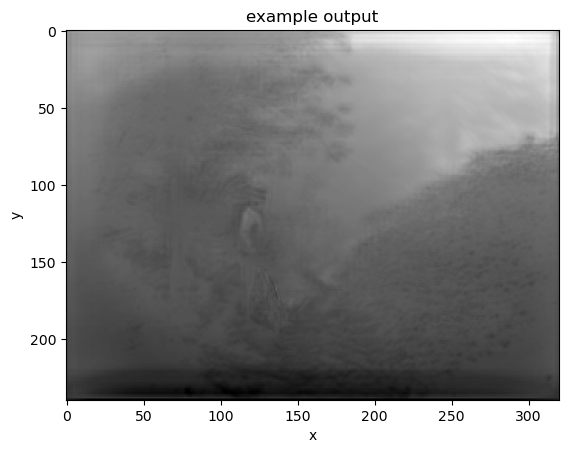

____________________________________________________________________________________________________
Examined samples: 101000 - loss: 55903.0859 - current acc: 0.7300
Examined samples: 102000 - loss: 56446.6953 - current acc: 0.7301
Examined samples: 103000 - loss: 57021.9023 - current acc: 0.7302
Examined samples: 104000 - loss: 57621.7695 - current acc: 0.7301
Examined samples: 105000 - loss: 58172.1445 - current acc: 0.7301
Examined samples: 106000 - loss: 58688.6602 - current acc: 0.7303
Examined samples: 107000 - loss: 59246.0156 - current acc: 0.7304
Examined samples: 108000 - loss: 59794.6758 - current acc: 0.7304
Examined samples: 109000 - loss: 60333.3359 - current acc: 0.7303
Examined samples: 110000 - loss: 60912.4961 - current acc: 0.7303


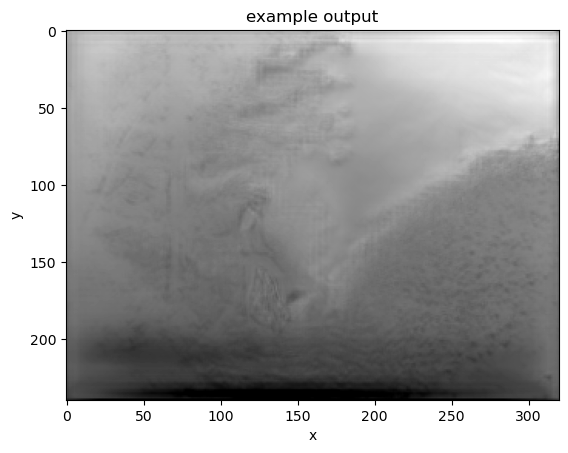

____________________________________________________________________________________________________
Examined samples: 111000 - loss: 61445.0664 - current acc: 0.7303
Examined samples: 112000 - loss: 62025.0664 - current acc: 0.7303
Examined samples: 113000 - loss: 62602.2578 - current acc: 0.7303
Examined samples: 114000 - loss: 63147.6602 - current acc: 0.7303
Examined samples: 115000 - loss: 63699.5078 - current acc: 0.7304
Examined samples: 116000 - loss: 64272.4688 - current acc: 0.7302
Examined samples: 117000 - loss: 64825.3281 - current acc: 0.7303
Examined samples: 118000 - loss: 65372.6875 - current acc: 0.7303
Examined samples: 119000 - loss: 65898.4922 - current acc: 0.7303
Examined samples: 120000 - loss: 66511.3672 - current acc: 0.7301


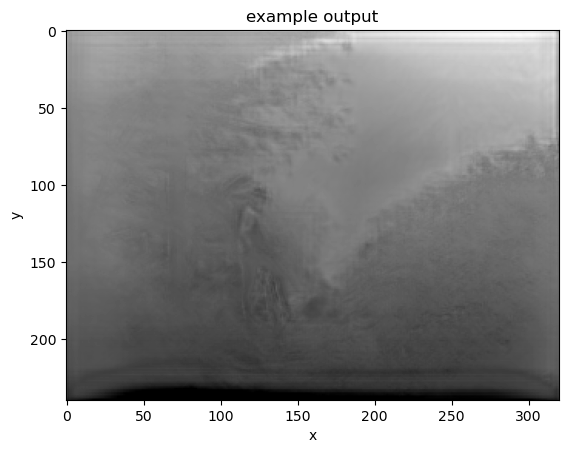

____________________________________________________________________________________________________
Examined samples: 121000 - loss: 67103.8203 - current acc: 0.7299
Examined samples: 122000 - loss: 67653.1641 - current acc: 0.7299
Examined samples: 123000 - loss: 68185.4609 - current acc: 0.7299
Examined samples: 124000 - loss: 68739.7656 - current acc: 0.7300
Examined samples: 125000 - loss: 69313.1953 - current acc: 0.7300
Examined samples: 126000 - loss: 69861.8750 - current acc: 0.7300
Examined samples: 127000 - loss: 70399.7344 - current acc: 0.7301
Examined samples: 128000 - loss: 70967.4219 - current acc: 0.7302
Examined samples: 129000 - loss: 71557.1719 - current acc: 0.7301
Examined samples: 130000 - loss: 72094.0234 - current acc: 0.7302


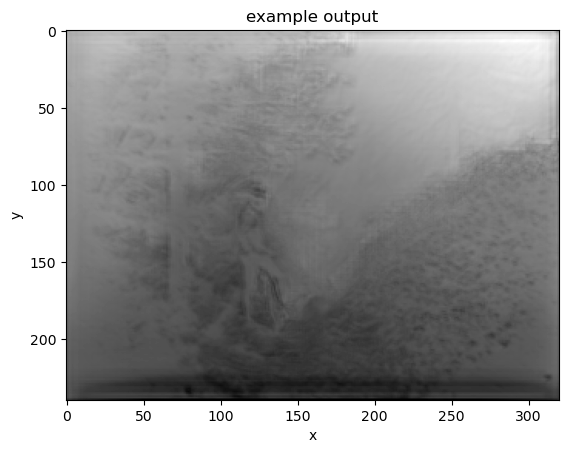

____________________________________________________________________________________________________
Examined samples: 131000 - loss: 72655.8594 - current acc: 0.7302
Examined samples: 132000 - loss: 73265.2266 - current acc: 0.7300
Examined samples: 133000 - loss: 73824.6484 - current acc: 0.7301
Examined samples: 134000 - loss: 74398.7109 - current acc: 0.7300
Examined samples: 135000 - loss: 74964.6719 - current acc: 0.7301
Examined samples: 136000 - loss: 75548.1094 - current acc: 0.7301
Examined samples: 137000 - loss: 76073.5156 - current acc: 0.7302
Examined samples: 138000 - loss: 76642.9141 - current acc: 0.7301
Examined samples: 139000 - loss: 77178.7969 - current acc: 0.7301
Examined samples: 140000 - loss: 77749.4219 - current acc: 0.7302


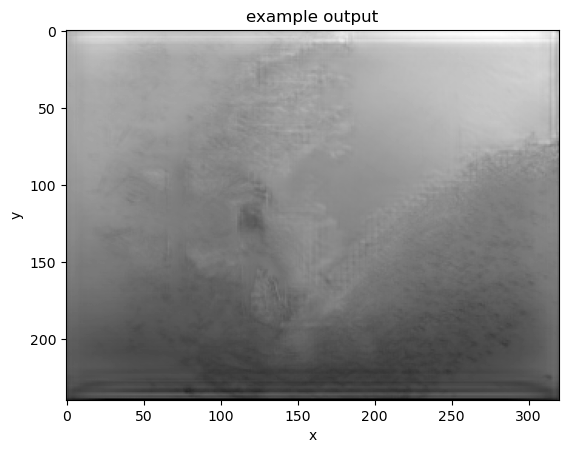

____________________________________________________________________________________________________
Examined samples: 141000 - loss: 78294.4688 - current acc: 0.7303
Examined samples: 142000 - loss: 78843.0469 - current acc: 0.7304
Examined samples: 143000 - loss: 79393.4609 - current acc: 0.7304
Examined samples: 144000 - loss: 79964.9375 - current acc: 0.7303
Examined samples: 145000 - loss: 80524.4297 - current acc: 0.7303
Examined samples: 146000 - loss: 81078.4844 - current acc: 0.7303
Examined samples: 147000 - loss: 81582.2266 - current acc: 0.7305
Examined samples: 148000 - loss: 82101.5938 - current acc: 0.7307
Examined samples: 149000 - loss: 82656.1328 - current acc: 0.7309
Examined samples: 150000 - loss: 83217.2109 - current acc: 0.7309


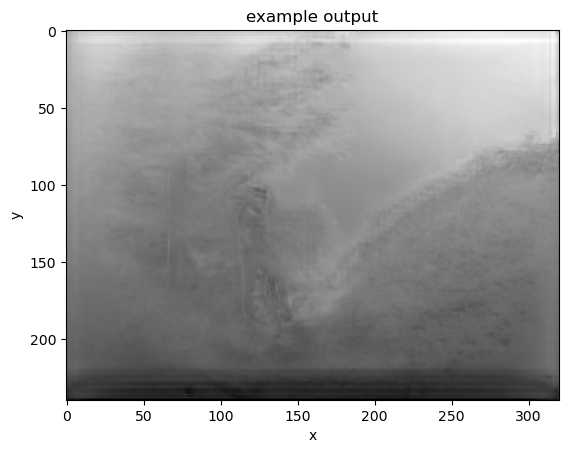

____________________________________________________________________________________________________
Examined samples: 151000 - loss: 83760.6484 - current acc: 0.7310
Examined samples: 152000 - loss: 84320.2812 - current acc: 0.7309
Examined samples: 153000 - loss: 84835.7812 - current acc: 0.7311
Examined samples: 154000 - loss: 85386.1953 - current acc: 0.7311
Examined samples: 155000 - loss: 85954.1797 - current acc: 0.7312
Examined samples: 156000 - loss: 86528.4922 - current acc: 0.7311
Examined samples: 157000 - loss: 87113.3750 - current acc: 0.7310
Examined samples: 158000 - loss: 87649.3281 - current acc: 0.7311
Examined samples: 159000 - loss: 88196.9609 - current acc: 0.7312
Examined samples: 160000 - loss: 88706.4766 - current acc: 0.7313


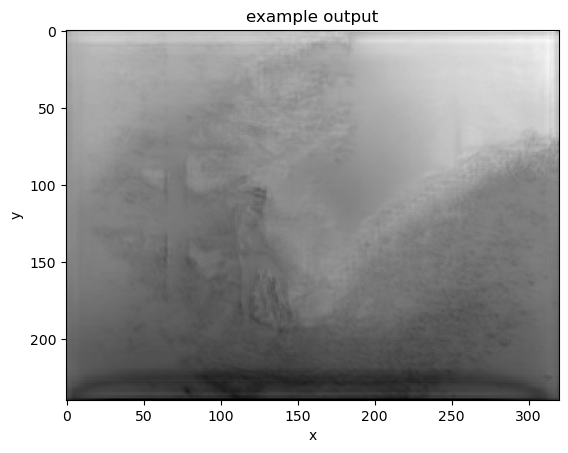

____________________________________________________________________________________________________
Examined samples: 161000 - loss: 89258.0781 - current acc: 0.7315
Examined samples: 162000 - loss: 89836.7969 - current acc: 0.7315
Examined samples: 163000 - loss: 90387.4688 - current acc: 0.7316
Examined samples: 164000 - loss: 90940.1172 - current acc: 0.7316
Examined samples: 165000 - loss: 91519.0703 - current acc: 0.7315
Examined samples: 166000 - loss: 92096.3750 - current acc: 0.7316
Examined samples: 167000 - loss: 92657.2031 - current acc: 0.7315
Examined samples: 168000 - loss: 93227.6406 - current acc: 0.7316
Examined samples: 169000 - loss: 93766.6875 - current acc: 0.7316
Examined samples: 170000 - loss: 94358.6094 - current acc: 0.7316


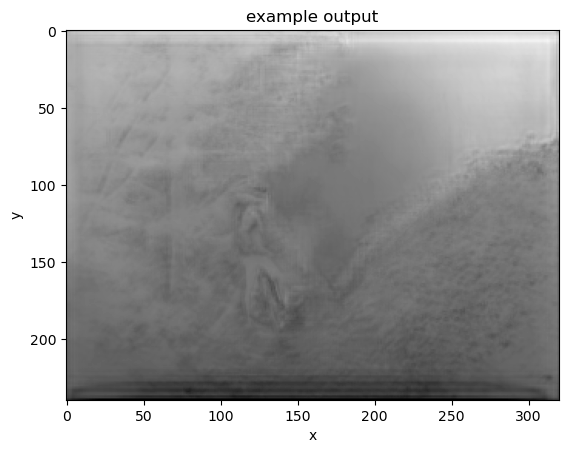

____________________________________________________________________________________________________
Examined samples: 171000 - loss: 94895.8203 - current acc: 0.7317
Examined samples: 172000 - loss: 95514.3516 - current acc: 0.7315
Examined samples: 173000 - loss: 96100.5547 - current acc: 0.7315
Examined samples: 174000 - loss: 96643.3984 - current acc: 0.7315
Examined samples: 175000 - loss: 97220.3984 - current acc: 0.7314
Examined samples: 176000 - loss: 97823.4531 - current acc: 0.7312
Examined samples: 177000 - loss: 98326.4766 - current acc: 0.7313
Examined samples: 178000 - loss: 98854.6484 - current acc: 0.7314
Examined samples: 179000 - loss: 99376.6172 - current acc: 0.7316
Examined samples: 180000 - loss: 99961.9688 - current acc: 0.7315


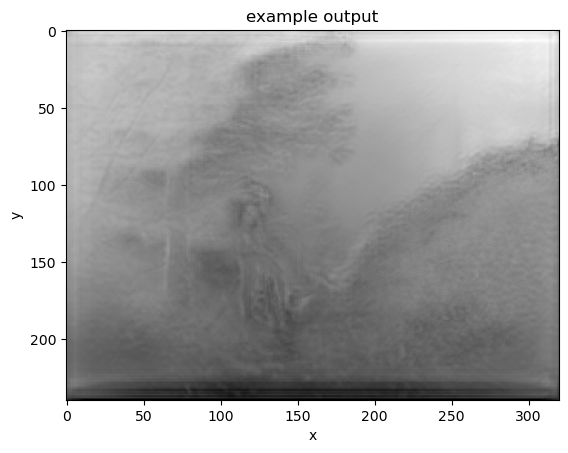

____________________________________________________________________________________________________
Examined samples: 181000 - loss: 100506.4141 - current acc: 0.7316
Examined samples: 182000 - loss: 101069.4375 - current acc: 0.7316
Examined samples: 183000 - loss: 101623.3125 - current acc: 0.7316
Examined samples: 184000 - loss: 102166.4219 - current acc: 0.7317
Examined samples: 185000 - loss: 102737.7969 - current acc: 0.7316
Examined samples: 186000 - loss: 103231.1328 - current acc: 0.7318
Examined samples: 187000 - loss: 103813.2578 - current acc: 0.7318
Examined samples: 188000 - loss: 104362.4219 - current acc: 0.7318
Examined samples: 189000 - loss: 104942.8359 - current acc: 0.7317
Examined samples: 190000 - loss: 105482.3750 - current acc: 0.7317


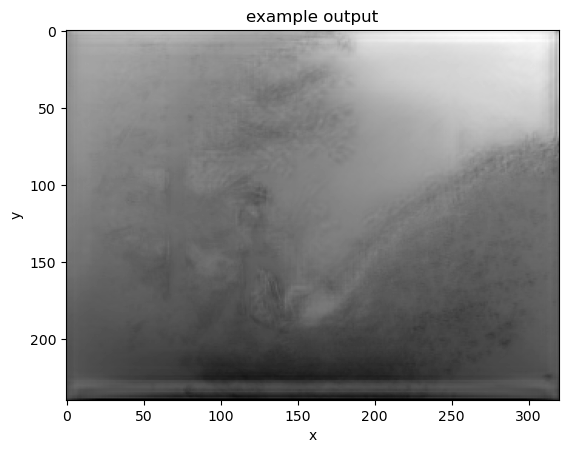

____________________________________________________________________________________________________
Examined samples: 191000 - loss: 106005.3594 - current acc: 0.7318
Examined samples: 192000 - loss: 106580.3828 - current acc: 0.7317
Examined samples: 193000 - loss: 107153.0859 - current acc: 0.7317
Examined samples: 194000 - loss: 107703.2266 - current acc: 0.7317
Examined samples: 195000 - loss: 108296.1875 - current acc: 0.7317
Examined samples: 196000 - loss: 108870.2734 - current acc: 0.7316
Examined samples: 197000 - loss: 109405.8047 - current acc: 0.7317
Examined samples: 198000 - loss: 109965.0781 - current acc: 0.7317
Examined samples: 199000 - loss: 110528.3828 - current acc: 0.7317
Examined samples: 200000 - loss: 111114.7266 - current acc: 0.7316


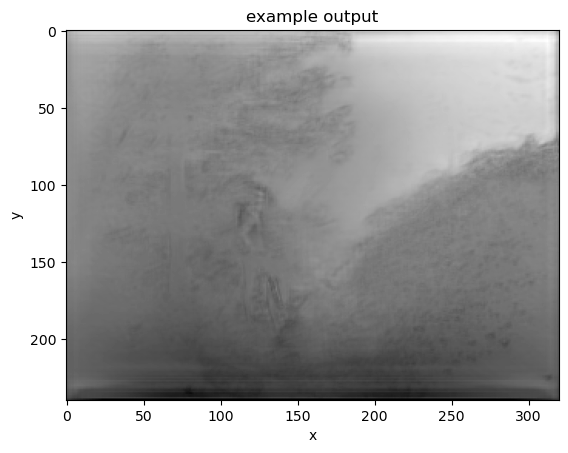

____________________________________________________________________________________________________
Examined samples: 201000 - loss: 111672.8438 - current acc: 0.7316
Examined samples: 202000 - loss: 112238.0469 - current acc: 0.7317
Examined samples: 203000 - loss: 112796.3750 - current acc: 0.7317
Examined samples: 204000 - loss: 113387.1719 - current acc: 0.7316
Examined samples: 205000 - loss: 113924.9688 - current acc: 0.7316
Examined samples: 206000 - loss: 114512.1016 - current acc: 0.7316
Examined samples: 207000 - loss: 115116.2500 - current acc: 0.7315
Examined samples: 208000 - loss: 115711.0547 - current acc: 0.7315
Examined samples: 209000 - loss: 116297.9531 - current acc: 0.7314
Examined samples: 210000 - loss: 116821.3672 - current acc: 0.7314


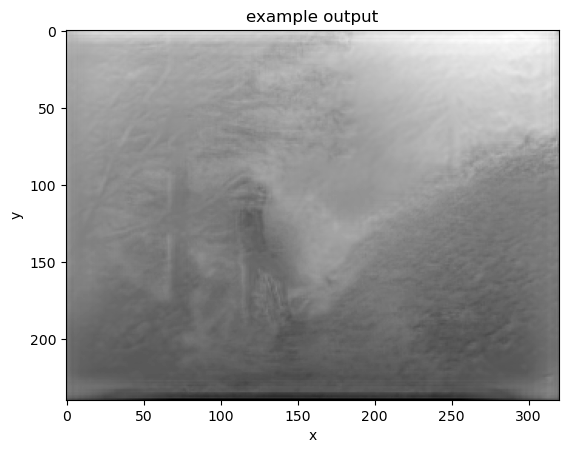

____________________________________________________________________________________________________
Examined samples: 211000 - loss: 117370.0234 - current acc: 0.7314
Examined samples: 212000 - loss: 117938.5156 - current acc: 0.7314
Examined samples: 213000 - loss: 118525.2188 - current acc: 0.7314
Examined samples: 214000 - loss: 119097.7109 - current acc: 0.7313
Examined samples: 215000 - loss: 119632.5625 - current acc: 0.7313
Examined samples: 216000 - loss: 120177.7734 - current acc: 0.7313
Examined samples: 217000 - loss: 120722.5938 - current acc: 0.7314
Examined samples: 218000 - loss: 121278.7188 - current acc: 0.7314
Examined samples: 219000 - loss: 121844.9844 - current acc: 0.7314
Examined samples: 220000 - loss: 122377.7578 - current acc: 0.7314


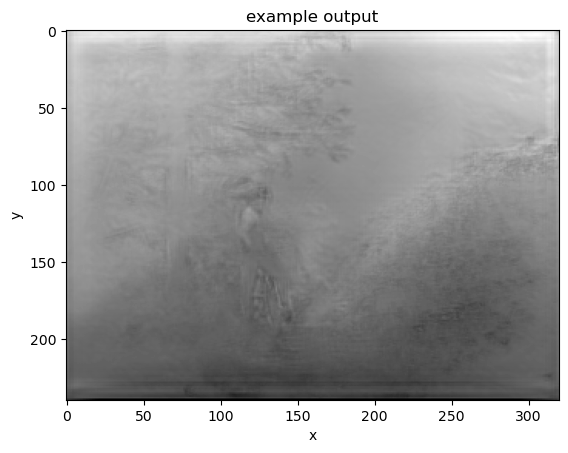

____________________________________________________________________________________________________
Examined samples: 221000 - loss: 122909.5859 - current acc: 0.7315
Examined samples: 222000 - loss: 123483.2422 - current acc: 0.7315
Examined samples: 223000 - loss: 123976.8750 - current acc: 0.7316
Examined samples: 224000 - loss: 124509.3047 - current acc: 0.7316
Examined samples: 225000 - loss: 125057.4062 - current acc: 0.7317
Examined samples: 226000 - loss: 125597.6328 - current acc: 0.7317
Examined samples: 227000 - loss: 126185.1406 - current acc: 0.7317
Examined samples: 228000 - loss: 126732.7812 - current acc: 0.7317
Examined samples: 229000 - loss: 127241.3516 - current acc: 0.7318
Examined samples: 230000 - loss: 127779.3203 - current acc: 0.7319


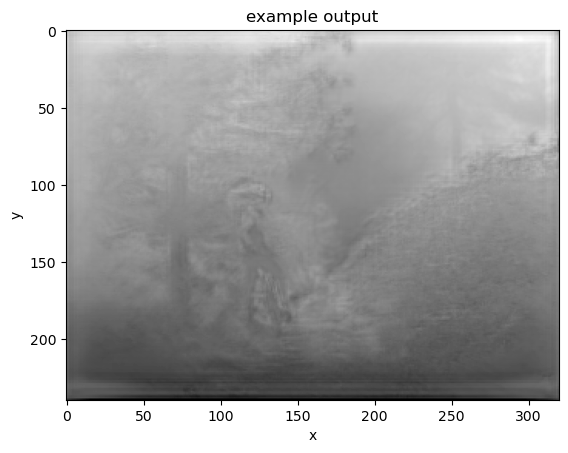

____________________________________________________________________________________________________
Examined samples: 231000 - loss: 128345.3438 - current acc: 0.7319
Examined samples: 232000 - loss: 128943.1562 - current acc: 0.7319
Examined samples: 233000 - loss: 129475.5469 - current acc: 0.7320
Examined samples: 234000 - loss: 130042.2344 - current acc: 0.7320
Examined samples: 235000 - loss: 130597.6328 - current acc: 0.7320
Examined samples: 236000 - loss: 131141.8594 - current acc: 0.7320
Examined samples: 237000 - loss: 131687.9219 - current acc: 0.7321
Examined samples: 238000 - loss: 132194.8906 - current acc: 0.7322
Examined samples: 239000 - loss: 132749.2500 - current acc: 0.7322
Examined samples: 240000 - loss: 133274.8906 - current acc: 0.7322


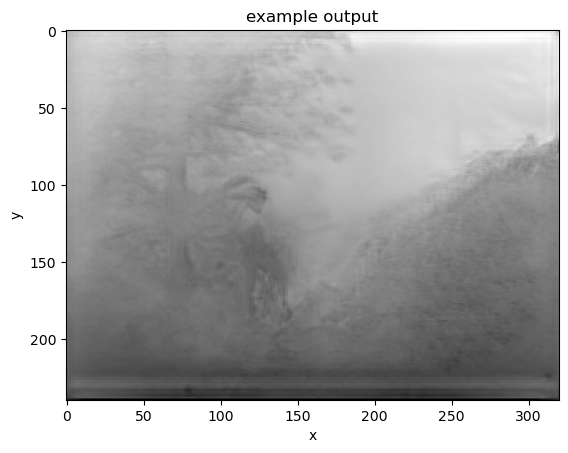

____________________________________________________________________________________________________
Examined samples: 241000 - loss: 133866.5312 - current acc: 0.7321
Examined samples: 242000 - loss: 134414.4062 - current acc: 0.7321
Examined samples: 243000 - loss: 134983.1875 - current acc: 0.7321
Examined samples: 244000 - loss: 135604.7031 - current acc: 0.7321
Examined samples: 245000 - loss: 136164.2969 - current acc: 0.7320
Examined samples: 246000 - loss: 136716.2031 - current acc: 0.7320
Examined samples: 247000 - loss: 137240.4844 - current acc: 0.7321
Examined samples: 248000 - loss: 137806.6250 - current acc: 0.7322
Examined samples: 249000 - loss: 138366.8750 - current acc: 0.7321
Examined samples: 250000 - loss: 138948.0000 - current acc: 0.7321


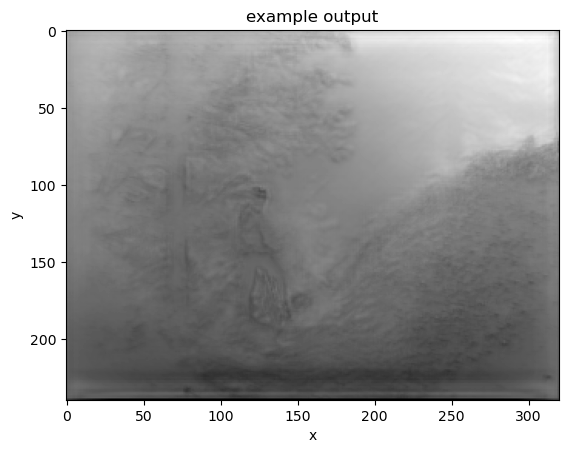

____________________________________________________________________________________________________
Examined samples: 251000 - loss: 139530.0000 - current acc: 0.7321
Examined samples: 252000 - loss: 140094.5469 - current acc: 0.7320
Examined samples: 253000 - loss: 140632.3125 - current acc: 0.7321
Examined samples: 254000 - loss: 141165.1875 - current acc: 0.7321
Examined samples: 255000 - loss: 141773.3750 - current acc: 0.7320
Examined samples: 256000 - loss: 142360.8438 - current acc: 0.7320
Examined samples: 257000 - loss: 142892.5156 - current acc: 0.7320
Examined samples: 258000 - loss: 143448.8906 - current acc: 0.7321
Examined samples: 259000 - loss: 143997.7188 - current acc: 0.7322
Examined samples: 260000 - loss: 144544.5781 - current acc: 0.7321


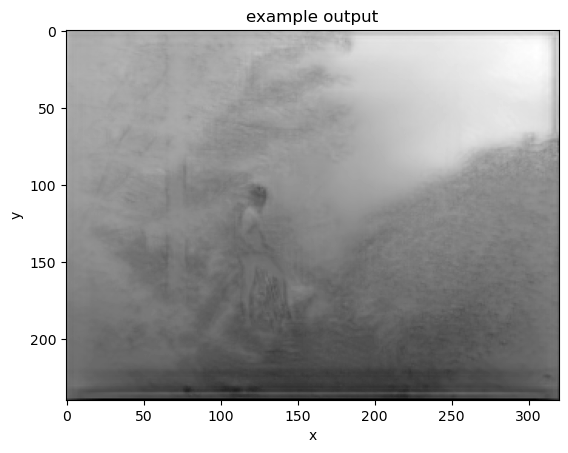

____________________________________________________________________________________________________
Examined samples: 261000 - loss: 145118.4688 - current acc: 0.7321
Examined samples: 262000 - loss: 145654.0156 - current acc: 0.7321
Examined samples: 263000 - loss: 146208.6250 - current acc: 0.7321
Examined samples: 264000 - loss: 146743.0156 - current acc: 0.7323
Examined samples: 265000 - loss: 147251.5156 - current acc: 0.7324
Examined samples: 266000 - loss: 147806.0000 - current acc: 0.7324
Examined samples: 267000 - loss: 148295.3281 - current acc: 0.7325
Examined samples: 268000 - loss: 148858.6406 - current acc: 0.7325
Examined samples: 269000 - loss: 149384.9062 - current acc: 0.7325
Examined samples: 270000 - loss: 149959.9219 - current acc: 0.7326


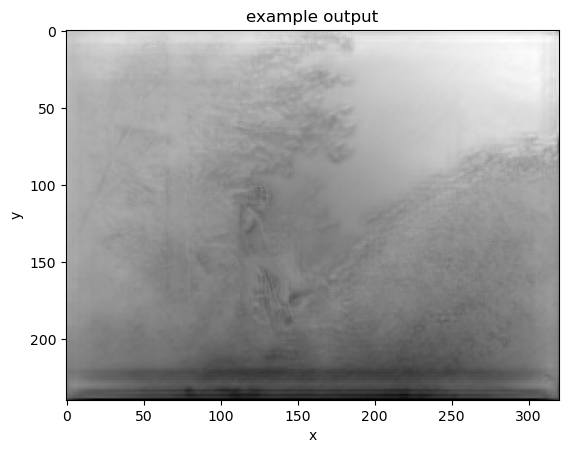

____________________________________________________________________________________________________
Examined samples: 271000 - loss: 150466.0469 - current acc: 0.7326
Examined samples: 272000 - loss: 151049.0000 - current acc: 0.7326
Examined samples: 273000 - loss: 151621.2500 - current acc: 0.7326
Examined samples: 274000 - loss: 152164.8438 - current acc: 0.7325
Examined samples: 275000 - loss: 152726.2031 - current acc: 0.7325
Examined samples: 276000 - loss: 153285.8125 - current acc: 0.7325
Examined samples: 277000 - loss: 153875.1406 - current acc: 0.7324
Examined samples: 278000 - loss: 154386.3438 - current acc: 0.7324
Examined samples: 279000 - loss: 154959.0938 - current acc: 0.7324
Examined samples: 280000 - loss: 155507.2656 - current acc: 0.7325


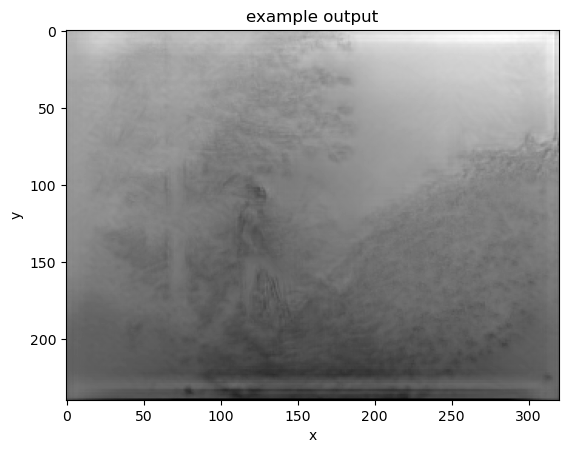

____________________________________________________________________________________________________
Examined samples: 281000 - loss: 156066.3594 - current acc: 0.7324
Examined samples: 282000 - loss: 156629.7656 - current acc: 0.7324
Examined samples: 283000 - loss: 157193.9531 - current acc: 0.7325
Examined samples: 284000 - loss: 157688.7031 - current acc: 0.7325
Examined samples: 285000 - loss: 158279.0938 - current acc: 0.7325
Examined samples: 286000 - loss: 158842.5312 - current acc: 0.7325
Examined samples: 287000 - loss: 159417.1875 - current acc: 0.7325
Examined samples: 288000 - loss: 159987.2188 - current acc: 0.7325
Examined samples: 289000 - loss: 160524.4531 - current acc: 0.7325
Examined samples: 290000 - loss: 161112.0000 - current acc: 0.7325


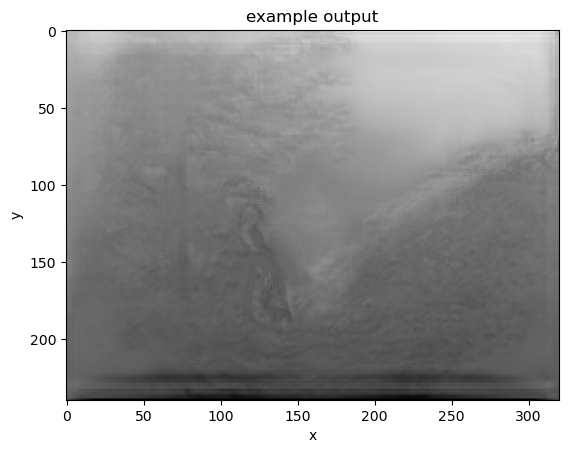

____________________________________________________________________________________________________
Examined samples: 291000 - loss: 161656.9844 - current acc: 0.7325
Examined samples: 292000 - loss: 162213.9688 - current acc: 0.7325
Examined samples: 293000 - loss: 162785.6875 - current acc: 0.7325
Examined samples: 294000 - loss: 163311.9688 - current acc: 0.7326
Examined samples: 295000 - loss: 163844.1875 - current acc: 0.7326
Examined samples: 296000 - loss: 164403.6562 - current acc: 0.7326
Examined samples: 297000 - loss: 164935.7188 - current acc: 0.7326
Examined samples: 298000 - loss: 165474.5938 - current acc: 0.7327
Examined samples: 299000 - loss: 166029.0000 - current acc: 0.7327
Examined samples: 300000 - loss: 166570.2812 - current acc: 0.7328


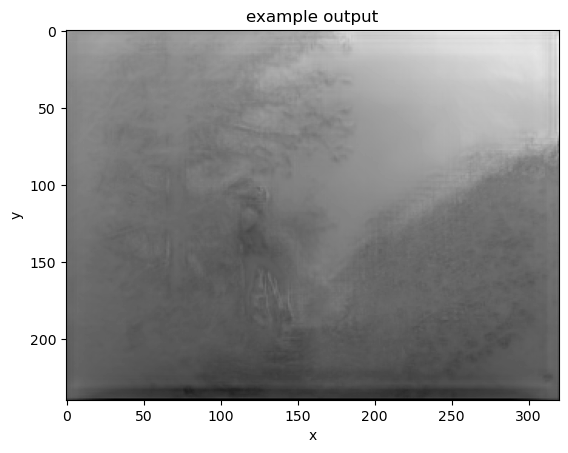

____________________________________________________________________________________________________
Examined samples: 301000 - loss: 167174.3125 - current acc: 0.7327
Examined samples: 302000 - loss: 167753.5938 - current acc: 0.7328
Examined samples: 303000 - loss: 168295.4219 - current acc: 0.7328
Examined samples: 304000 - loss: 168846.4531 - current acc: 0.7329
Examined samples: 305000 - loss: 169371.1719 - current acc: 0.7329
Examined samples: 306000 - loss: 169949.5781 - current acc: 0.7329
Examined samples: 307000 - loss: 170486.9219 - current acc: 0.7329
Examined samples: 308000 - loss: 171036.5469 - current acc: 0.7329
Examined samples: 309000 - loss: 171569.4219 - current acc: 0.7329
Examined samples: 310000 - loss: 172123.6562 - current acc: 0.7330


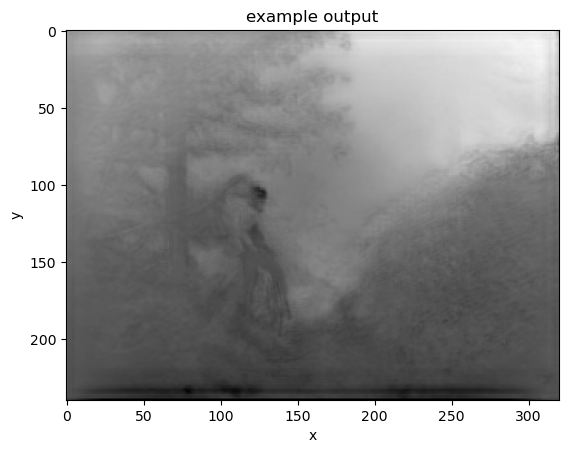

____________________________________________________________________________________________________
Examined samples: 311000 - loss: 172659.7656 - current acc: 0.7330
Examined samples: 312000 - loss: 173224.7344 - current acc: 0.7330
Examined samples: 313000 - loss: 173813.2344 - current acc: 0.7329
Examined samples: 314000 - loss: 174399.2188 - current acc: 0.7329
Examined samples: 315000 - loss: 174943.0312 - current acc: 0.7330
Examined samples: 316000 - loss: 175463.9375 - current acc: 0.7330
Examined samples: 317000 - loss: 176045.6719 - current acc: 0.7329
Examined samples: 318000 - loss: 176613.9844 - current acc: 0.7330
Examined samples: 319000 - loss: 177158.5781 - current acc: 0.7330
Examined samples: 320000 - loss: 177705.0938 - current acc: 0.7330


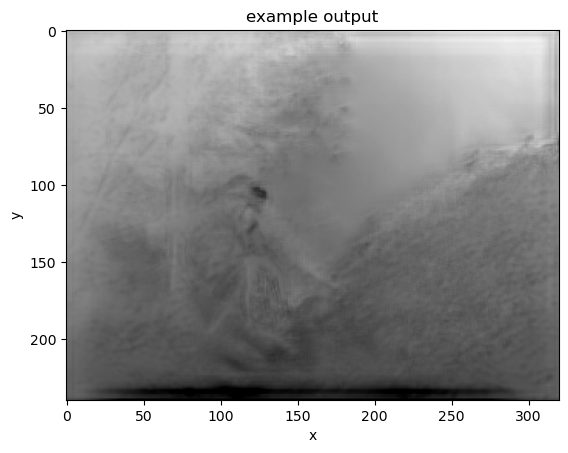

____________________________________________________________________________________________________
Examined samples: 321000 - loss: 178310.6250 - current acc: 0.7330
Examined samples: 322000 - loss: 178932.6094 - current acc: 0.7329
Examined samples: 323000 - loss: 179462.5625 - current acc: 0.7329
Examined samples: 324000 - loss: 180109.3594 - current acc: 0.7329
Examined samples: 325000 - loss: 180658.5781 - current acc: 0.7329
Examined samples: 326000 - loss: 181187.8438 - current acc: 0.7329
Examined samples: 327000 - loss: 181726.4062 - current acc: 0.7329
Examined samples: 328000 - loss: 182257.9531 - current acc: 0.7330
Examined samples: 329000 - loss: 182787.0625 - current acc: 0.7330
Examined samples: 330000 - loss: 183352.6406 - current acc: 0.7330


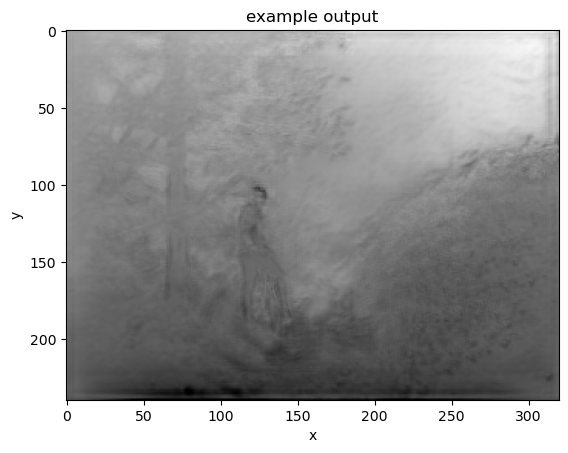

____________________________________________________________________________________________________
Examined samples: 331000 - loss: 183943.1875 - current acc: 0.7330
Examined samples: 332000 - loss: 184479.2656 - current acc: 0.7330
Examined samples: 333000 - loss: 185057.0156 - current acc: 0.7330
Examined samples: 334000 - loss: 185585.2656 - current acc: 0.7331
Examined samples: 335000 - loss: 186190.6250 - current acc: 0.7331
Examined samples: 336000 - loss: 186727.2812 - current acc: 0.7330
Examined samples: 337000 - loss: 187264.7031 - current acc: 0.7330
Examined samples: 338000 - loss: 187856.7656 - current acc: 0.7330
Examined samples: 339000 - loss: 188441.5938 - current acc: 0.7330
Examined samples: 340000 - loss: 189001.2969 - current acc: 0.7330


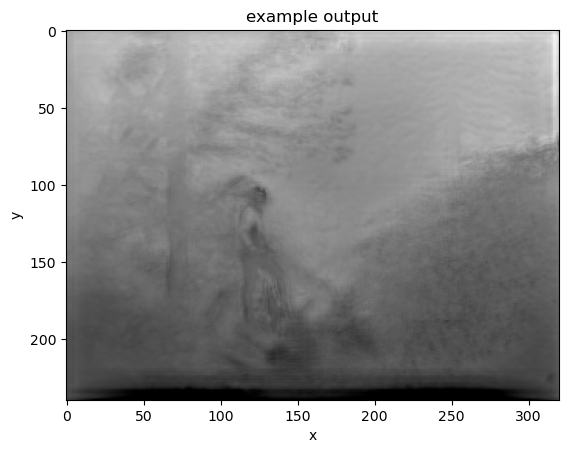

____________________________________________________________________________________________________
Examined samples: 341000 - loss: 189590.9375 - current acc: 0.7330
Examined samples: 342000 - loss: 190131.7969 - current acc: 0.7330
Examined samples: 343000 - loss: 190655.4844 - current acc: 0.7330
Examined samples: 344000 - loss: 191215.1875 - current acc: 0.7331
Examined samples: 345000 - loss: 191751.1406 - current acc: 0.7331
Examined samples: 346000 - loss: 192315.4531 - current acc: 0.7330
Examined samples: 347000 - loss: 192882.5000 - current acc: 0.7330
Examined samples: 348000 - loss: 193468.0469 - current acc: 0.7330
Examined samples: 349000 - loss: 194007.0625 - current acc: 0.7330
Examined samples: 350000 - loss: 194588.5312 - current acc: 0.7330


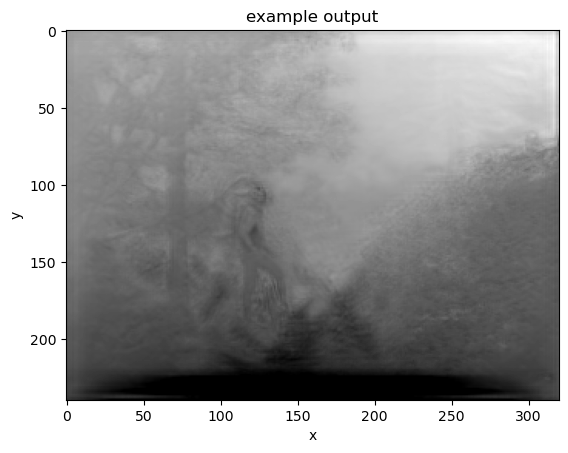

____________________________________________________________________________________________________
Examined samples: 351000 - loss: 195110.4688 - current acc: 0.7331
Examined samples: 352000 - loss: 195667.2656 - current acc: 0.7331
Examined samples: 353000 - loss: 196237.4688 - current acc: 0.7331
Examined samples: 354000 - loss: 196827.6562 - current acc: 0.7331
Examined samples: 355000 - loss: 197415.2500 - current acc: 0.7331
Examined samples: 356000 - loss: 197917.6094 - current acc: 0.7332
Examined samples: 357000 - loss: 198449.5000 - current acc: 0.7333
Examined samples: 358000 - loss: 198955.8125 - current acc: 0.7333
Examined samples: 359000 - loss: 199551.4375 - current acc: 0.7333
Examined samples: 360000 - loss: 200081.8125 - current acc: 0.7334


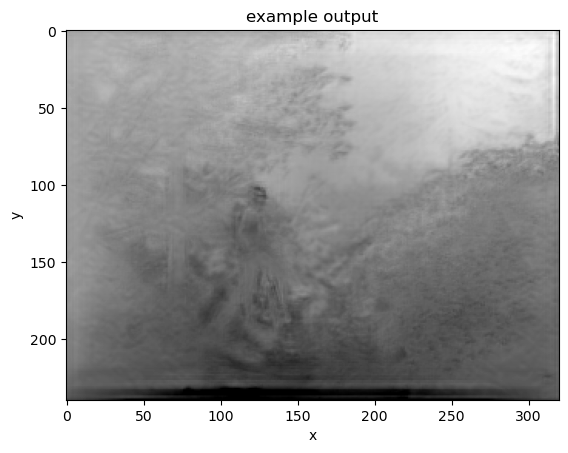

____________________________________________________________________________________________________
Examined samples: 361000 - loss: 200634.7500 - current acc: 0.7333
Examined samples: 362000 - loss: 201194.0938 - current acc: 0.7333
Examined samples: 363000 - loss: 201741.8594 - current acc: 0.7334
Examined samples: 364000 - loss: 202291.2188 - current acc: 0.7334
Examined samples: 365000 - loss: 202845.2188 - current acc: 0.7334
Examined samples: 366000 - loss: 203411.2031 - current acc: 0.7334
Examined samples: 367000 - loss: 203967.2656 - current acc: 0.7334
Examined samples: 368000 - loss: 204528.6719 - current acc: 0.7334
Examined samples: 369000 - loss: 205099.3750 - current acc: 0.7333
Examined samples: 370000 - loss: 205699.6406 - current acc: 0.7333


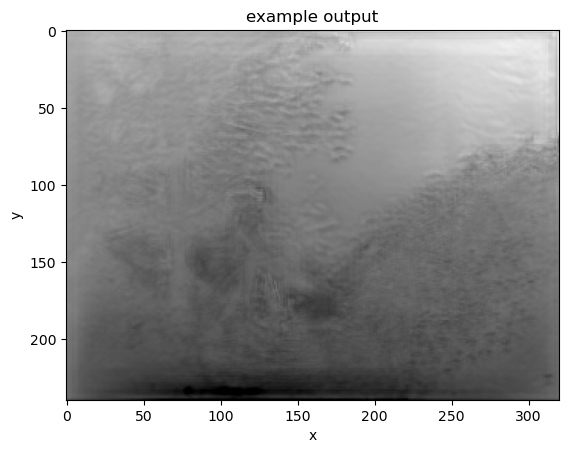

____________________________________________________________________________________________________
Examined samples: 371000 - loss: 206328.0625 - current acc: 0.7333
Examined samples: 372000 - loss: 206912.9375 - current acc: 0.7333
Examined samples: 373000 - loss: 207448.3750 - current acc: 0.7333
Examined samples: 374000 - loss: 207971.3750 - current acc: 0.7334
Examined samples: 375000 - loss: 208502.0625 - current acc: 0.7334
Examined samples: 376000 - loss: 209077.8125 - current acc: 0.7334
Examined samples: 377000 - loss: 209639.6094 - current acc: 0.7334
Examined samples: 378000 - loss: 210210.6094 - current acc: 0.7334
Examined samples: 379000 - loss: 210748.5156 - current acc: 0.7334
Examined samples: 380000 - loss: 211289.4844 - current acc: 0.7334


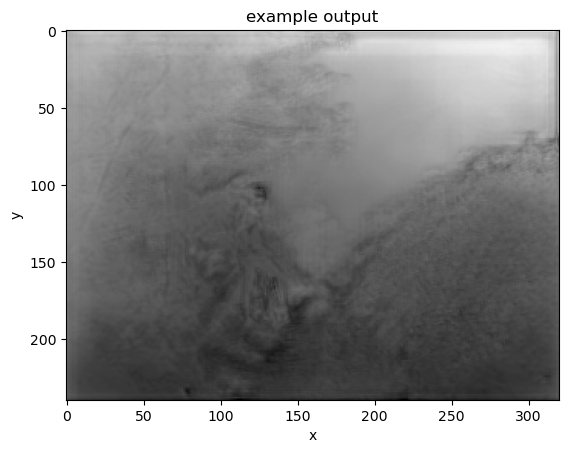

____________________________________________________________________________________________________
Examined samples: 381000 - loss: 211799.9844 - current acc: 0.7335
Examined samples: 382000 - loss: 212333.1562 - current acc: 0.7336
Examined samples: 383000 - loss: 212885.1562 - current acc: 0.7336
Examined samples: 384000 - loss: 213470.6719 - current acc: 0.7336
Examined samples: 385000 - loss: 214037.3594 - current acc: 0.7336
Examined samples: 386000 - loss: 214547.7656 - current acc: 0.7336
Examined samples: 387000 - loss: 215102.7969 - current acc: 0.7337
Examined samples: 388000 - loss: 215631.4531 - current acc: 0.7337
Examined samples: 389000 - loss: 216168.1094 - current acc: 0.7338
Examined samples: 390000 - loss: 216742.7344 - current acc: 0.7338


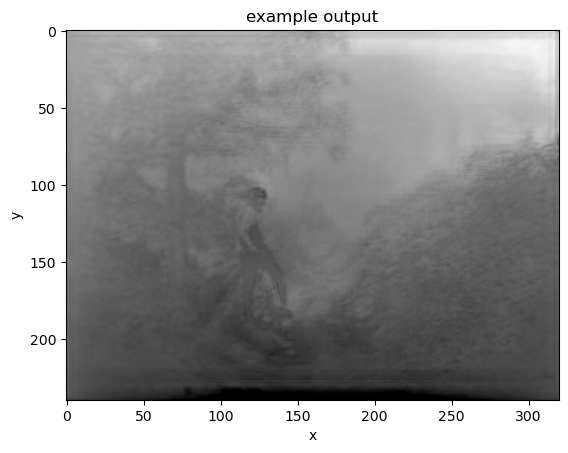

____________________________________________________________________________________________________
Examined samples: 391000 - loss: 217283.2031 - current acc: 0.7338
Examined samples: 392000 - loss: 217792.7188 - current acc: 0.7338
Examined samples: 393000 - loss: 218305.1719 - current acc: 0.7339
Examined samples: 394000 - loss: 218869.7344 - current acc: 0.7339
Examined samples: 395000 - loss: 219376.0000 - current acc: 0.7339
Examined samples: 396000 - loss: 219931.0469 - current acc: 0.7339
Examined samples: 397000 - loss: 220484.9844 - current acc: 0.7340
Examined samples: 398000 - loss: 221049.5312 - current acc: 0.7340
Examined samples: 399000 - loss: 221573.1406 - current acc: 0.7340
Examined samples: 400000 - loss: 222111.7031 - current acc: 0.7341


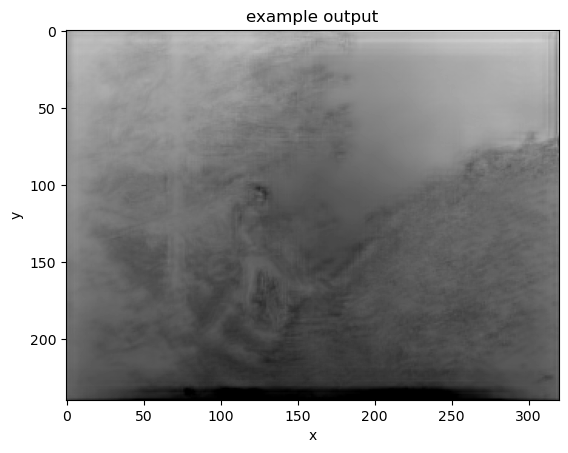

____________________________________________________________________________________________________
Examined samples: 401000 - loss: 222626.4688 - current acc: 0.7341
Examined samples: 402000 - loss: 223160.1094 - current acc: 0.7341
Examined samples: 403000 - loss: 223719.2344 - current acc: 0.7341
Examined samples: 404000 - loss: 224307.4531 - current acc: 0.7341
train_loss: 224798.0625 - train_accuracy: 0.7342
Epoch 2 ends in 59096 seconds.


In [5]:
# Set optimizer
lr = 1e-4 # set learning rate (default at 1e-3)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipvalue=0.1)

# Instantiate loss function
my_loss = loss_fn("my_loss")

# Create 2 empty lists for train loss and accuracy
train_loss_list = []
train_acc_list = []

# Create an example image
name = ['./DIW_train_val/dc4b5a857a519b705dafb01354765e1714959a11.thumb']
example = load_images(name, DIW_PATH, input_width, input_height, False)

num_of_epochs = 2 # set number of epochs here (default at 2 due to computational limit)
for e in range(num_of_epochs): # loop through every epoch
    start = time.time()# start time recording
    print("Epoch {}/{}:".format(e + 1, num_of_epochs))
    
    filename_list = list(train_depth_info.keys()) # get all keys (filenames for training samples)
    np.random.shuffle(filename_list) # shuffle training samples for every epoch
    
    epoch_loss = 0
    epoch_correct = 0
    i = 0
    while i + batch_size < len(filename_list): # train through every batch
        batch_filename = np.asarray(filename_list[i:i+batch_size]) # get 4 image names
        images = load_images(batch_filename, DIW_PATH, input_width, input_height, False) # load 4 images
        labels = load_labels(batch_filename, train_depth_info) # load 4 labels
        i += batch_size
        
        # Train step
        with tf.GradientTape() as tape:
            pred = model_Hourglass(images, training=True) # forward pass
            batch_loss = my_loss(labels, pred) # compute loss
        grads = tape.gradient(batch_loss, model_Hourglass.trainable_weights) # back propagation
        optimizer.apply_gradients(zip(grads, model_Hourglass.trainable_weights)) # update parameters
        
        # Update training loss and accuracy
        batch_correct = check_fn(labels, pred) # check how many images are correctly classified
        epoch_loss += batch_loss
        epoch_correct += batch_correct
        
        if (i % 1000 == 0): # Display the loss value after every 1000 samples
            print("Examined samples: {} - loss: {:.4f} - current acc: {:.4f}".format(i,epoch_loss,epoch_correct/i))
            if (i % 10000 == 0) or (i == 1000): # Display an example after every 10000 samples
                plt.imshow(model_Hourglass(example)[0], cmap='gray')
                plt.xlabel("x")
                plt.ylabel("y")
                plt.title("example output")
                plt.savefig("epoch"+str(e)+"_iteration"+str(i)+".png")
                plt.show() # show the example output
                print("_" * 100) # draw a separation line
        
    # Get train accuracy
    train_loss = epoch_loss
    train_acc = epoch_correct/len(train_depth_info)
    
    # Append validation loss and accuracy to list (for plotting)
    train_loss_list.append(train_loss)
    train_acc_list.append(train_acc)
    
    # Display loss, accuracy, and time consuming at the end of each epoch
    print("train_loss: {:.4f} - train_accuracy: {:.4f}".format(train_loss, train_acc))
    print("Epoch {} ends in {:.0f} seconds.".format(e + 1, time.time() - start))
    print("=" * 100) # draw a separation line

### Save Model

In [8]:
model_Hourglass.save('model_Hourglass')
print("Model saved.")
print("train_loss", train_loss_list)
print("train_acc", train_acc_list)

INFO:tensorflow:Assets written to: model_Hourglass\assets


INFO:tensorflow:Assets written to: model_Hourglass\assets


Model saved.
train_loss [<tf.Tensor: shape=(), dtype=float32, numpy=229608.83>, <tf.Tensor: shape=(), dtype=float32, numpy=224798.06>]
train_acc [0.7113515115589805, 0.7341607389843904]


### Load ordinal notations from .csv file for testing

In [9]:
# Test label construction
test_depth_info = read_depth_info(DIW_PATH + '/DIW_test.csv', input_height, input_width)
# Print an example
print("train_val label example:", test_depth_info['./DIW_test/ad956b51882fce447aa5a5bb65e434366cb41aa1.thumb'])

Successfully processed 73983 labels from C://Users/admin/data/DIW_test.csv.
train_val label example: [[84, 44, 184, 185, 1]]


Yufan's Note: The label means [yA, xA, yB, xB, relation]. For the relation, "1" means point A is closer (A < B), and "-1" means point B is closer (A > B).

Tested samples: 1000 - loss: 501.7919 - acc: 0.7650


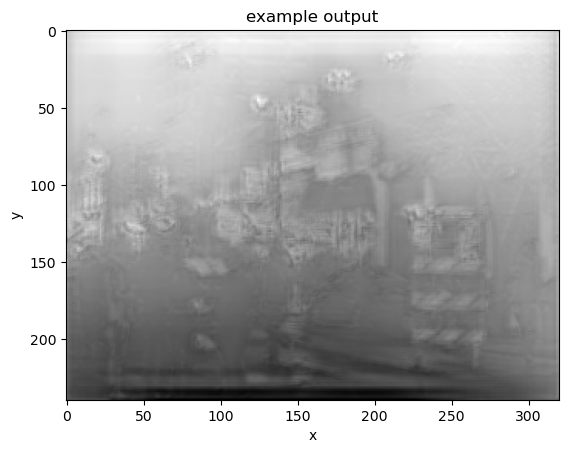

____________________________________________________________________________________________________
Tested samples: 2000 - loss: 1018.5782 - acc: 0.7595
Tested samples: 3000 - loss: 1507.1002 - acc: 0.7650
Tested samples: 4000 - loss: 2059.9844 - acc: 0.7578
Tested samples: 5000 - loss: 2602.5588 - acc: 0.7534
Tested samples: 6000 - loss: 3143.2561 - acc: 0.7502
Tested samples: 7000 - loss: 3672.5042 - acc: 0.7506
Tested samples: 8000 - loss: 4192.6680 - acc: 0.7489
Tested samples: 9000 - loss: 4719.3281 - acc: 0.7500
Tested samples: 10000 - loss: 5260.8975 - acc: 0.7489


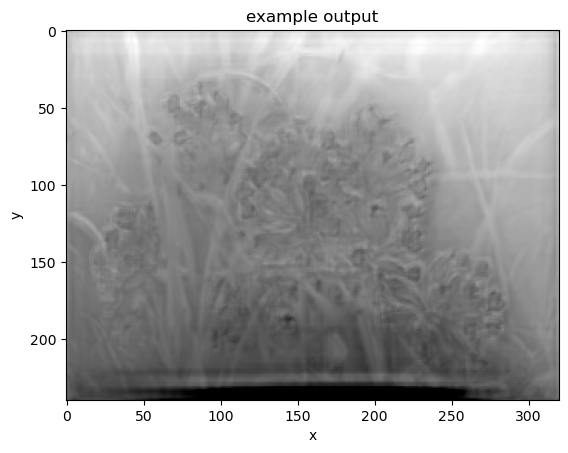

____________________________________________________________________________________________________
Tested samples: 11000 - loss: 5780.8560 - acc: 0.7481
Tested samples: 12000 - loss: 6298.5229 - acc: 0.7482
Tested samples: 13000 - loss: 6824.1260 - acc: 0.7485
Tested samples: 14000 - loss: 7367.3013 - acc: 0.7478
Tested samples: 15000 - loss: 7903.2212 - acc: 0.7467
Tested samples: 16000 - loss: 8499.4834 - acc: 0.7442
Tested samples: 17000 - loss: 9060.0293 - acc: 0.7440
Tested samples: 18000 - loss: 9602.9893 - acc: 0.7437
Tested samples: 19000 - loss: 10121.3057 - acc: 0.7439
Tested samples: 20000 - loss: 10636.7109 - acc: 0.7437


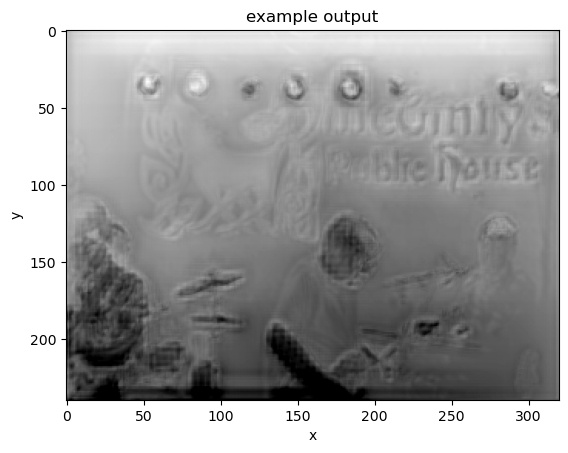

____________________________________________________________________________________________________
Tested samples: 21000 - loss: 11128.2715 - acc: 0.7444
Tested samples: 22000 - loss: 11665.6465 - acc: 0.7445
Tested samples: 23000 - loss: 12220.6797 - acc: 0.7453
Tested samples: 24000 - loss: 12785.9971 - acc: 0.7449
Tested samples: 25000 - loss: 13319.7207 - acc: 0.7442
Tested samples: 26000 - loss: 13885.8447 - acc: 0.7438
Tested samples: 27000 - loss: 14415.8984 - acc: 0.7440
Tested samples: 28000 - loss: 14955.7715 - acc: 0.7432
Tested samples: 29000 - loss: 15527.6660 - acc: 0.7425
Tested samples: 30000 - loss: 16047.0039 - acc: 0.7425


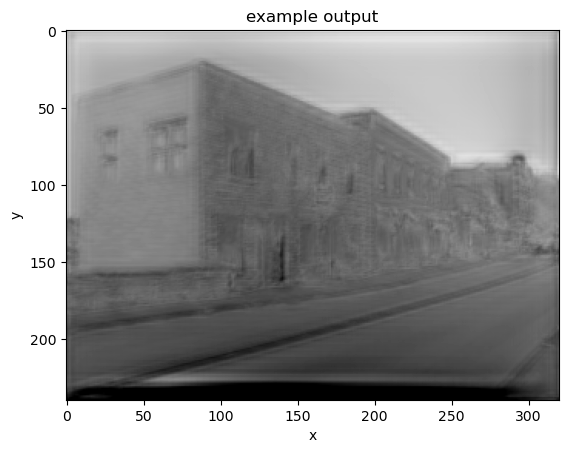

____________________________________________________________________________________________________
Tested samples: 31000 - loss: 16603.0801 - acc: 0.7425
Tested samples: 32000 - loss: 17142.4746 - acc: 0.7425
Tested samples: 33000 - loss: 17631.3711 - acc: 0.7431
Tested samples: 34000 - loss: 18173.1875 - acc: 0.7430
Tested samples: 35000 - loss: 18681.7773 - acc: 0.7431
Tested samples: 36000 - loss: 19191.2871 - acc: 0.7432
Tested samples: 37000 - loss: 19726.0137 - acc: 0.7432
Tested samples: 38000 - loss: 20243.7754 - acc: 0.7432
Tested samples: 39000 - loss: 20759.7461 - acc: 0.7436
Tested samples: 40000 - loss: 21290.0781 - acc: 0.7436


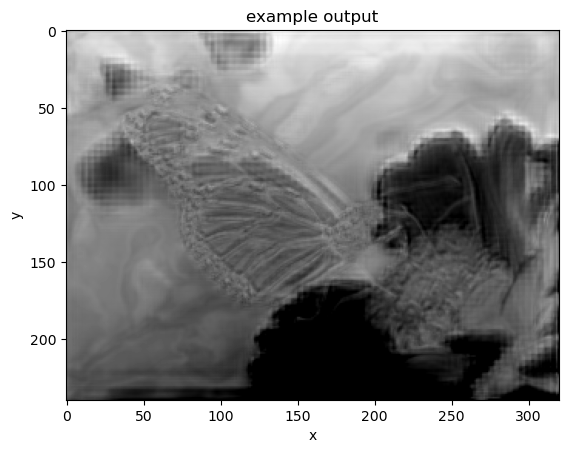

____________________________________________________________________________________________________
Tested samples: 41000 - loss: 21837.9316 - acc: 0.7435
Tested samples: 42000 - loss: 22411.5840 - acc: 0.7430
Tested samples: 43000 - loss: 22921.4453 - acc: 0.7434
Tested samples: 44000 - loss: 23487.0039 - acc: 0.7433
Tested samples: 45000 - loss: 24029.4961 - acc: 0.7433
Tested samples: 46000 - loss: 24615.9004 - acc: 0.7424
Tested samples: 47000 - loss: 25191.5020 - acc: 0.7420
Tested samples: 48000 - loss: 25720.6250 - acc: 0.7420
Tested samples: 49000 - loss: 26273.9531 - acc: 0.7416
Tested samples: 50000 - loss: 26813.8418 - acc: 0.7417


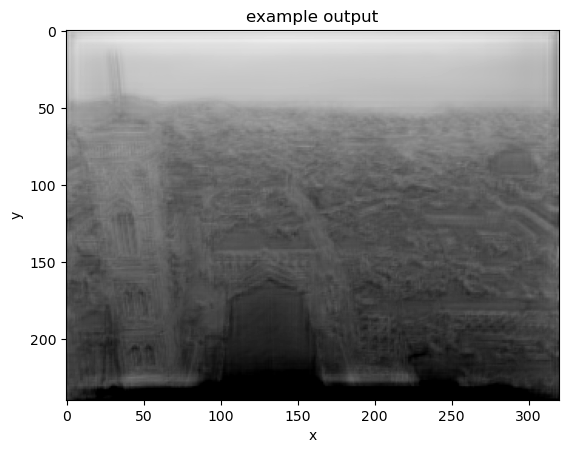

____________________________________________________________________________________________________
Tested samples: 51000 - loss: 27275.0527 - acc: 0.7423
Tested samples: 52000 - loss: 27807.0293 - acc: 0.7421
Tested samples: 53000 - loss: 28315.8086 - acc: 0.7423
Tested samples: 54000 - loss: 28836.5918 - acc: 0.7423
Tested samples: 55000 - loss: 29368.0039 - acc: 0.7421
Tested samples: 56000 - loss: 29936.8379 - acc: 0.7421
Tested samples: 57000 - loss: 30489.0547 - acc: 0.7419
Tested samples: 58000 - loss: 31030.1543 - acc: 0.7419
Tested samples: 59000 - loss: 31569.7012 - acc: 0.7420
Tested samples: 60000 - loss: 32145.7676 - acc: 0.7417


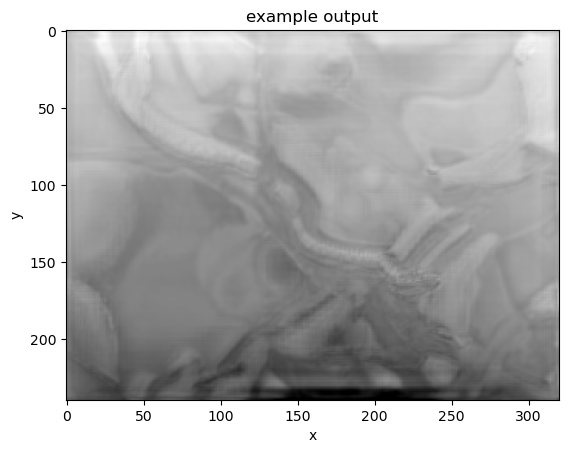

____________________________________________________________________________________________________
Tested samples: 61000 - loss: 32703.2441 - acc: 0.7414
Tested samples: 62000 - loss: 33250.1445 - acc: 0.7415
Tested samples: 63000 - loss: 33754.9844 - acc: 0.7414
Tested samples: 64000 - loss: 34292.0859 - acc: 0.7413
Tested samples: 65000 - loss: 34815.6211 - acc: 0.7412
Tested samples: 66000 - loss: 35344.8516 - acc: 0.7413
Tested samples: 67000 - loss: 35921.6914 - acc: 0.7411
Tested samples: 68000 - loss: 36442.0859 - acc: 0.7414
Tested samples: 69000 - loss: 36988.6211 - acc: 0.7411
Tested samples: 70000 - loss: 37534.4102 - acc: 0.7409


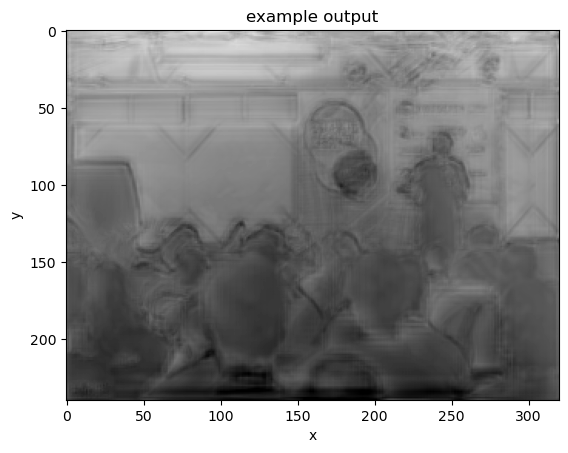

____________________________________________________________________________________________________
Tested samples: 71000 - loss: 38069.7773 - acc: 0.7407
Tested samples: 72000 - loss: 38622.3945 - acc: 0.7405
Tested samples: 73000 - loss: 39174.8594 - acc: 0.7405
test_loss: 39691.3203 - test_accuracy: 0.7407
Testing ends in 3466 seconds.


In [15]:
filename_list = list(test_depth_info.keys()) # get all keys (filenames for training samples)
np.random.shuffle(filename_list) # shuffle training samples for every epoch
    
test_loss = 0
test_acc = 0
i = 0
start = time.time()# start time recording
while i + batch_size < len(filename_list): # test through every batch
    batch_filename = np.asarray(filename_list[i:i+batch_size]) # get 4 image names
    images = load_images(batch_filename, DIW_PATH, input_width, input_height, False) # load 4 images
    labels = load_labels(batch_filename, test_depth_info) # load 4 labels
    i += batch_size
        
    # Test step
    pred = model_Hourglass(images, training=False)
       
    # Update test loss and accuracy
    test_loss += my_loss(labels, pred) # compute loss
    test_acc += check_fn(labels, pred) # check accuracy
        
    if (i % 1000 == 0): # Display the loss value after every 1000 samples
        print("Tested samples: {} - loss: {:.4f} - acc: {:.4f}".format(i,test_loss,test_acc/i))
        if (i % 10000 == 0) or (i == 1000): # Display an example after every 10000 samples
            plt.imshow(pred[0], cmap='gray')
            plt.xlabel("x")
            plt.ylabel("y")
            plt.title("example output")
            plt.savefig("test_"+str(i)+".png")
            plt.show() # show the example output
            print("_" * 100) # draw a separation line
            
# Display loss, accuracy, and time consuming
print("test_loss: {:.4f} - test_accuracy: {:.4f}".format(test_loss, test_acc/len(test_depth_info)))
print("Testing ends in {:.0f} seconds.".format(time.time() - start))
print("=" * 100) # draw a separation line